# Урванов Егор
# Climate Change Earth Surface Temperature Data
# МГУ, 8 октября, 2018

* Доделать распределение глобального изменения температуры, начиная с 1840 года
* Кластеризовать страны и города по профилю изменения температуры
* Изучить глобальные потепления и похолодания прошлого до текущего момента
* Изучить цикличность глобальных потеплений и похолоданий
* Изучить характер изменений глобальных потеплений и похолоданий
* Собрать информацию по потеплениям и похолоданиям в статьях
* Общие тенденции потепления и похолодания
* Оценка точности измерений (было ли потепление и похолодание)
* Есть ли изменение ускорения?
* Почему среднегодовая температура на Земле не равна нулю?

* Сравнить летние и зимние периоды. 
* Отрисовать летние и зимние периоды.
* Почему на общем графике видны максимумы и минимуым в других местах? 
* Глобальное потепление. 
* Доверительные интервалы для летних и зимних аномалий

## Немного про plot.ly

* Стал бесплатным
* Не нужна регистрация
* Динамические графики и картинки
* Плохое качество при экспорте картинок
* Всё-таки сыроват

## Немного про Jupyter Notebook Slides

* Возможность писать код и демонстрировать результаты сразу же при помощи [RISE](https://github.com/damianavila/RISE)
* Jupyter Notebook Slides сыроват (многое нужно делать с помощью правки конфигов). Но если принаровиться, то это клёво
* Возникли проблемы со скоролом. Следует залезть в `~/.local/share/jupyter/nbextensions/rise/main.js` и найти там `scroll: false` (или `scroll: true`, тогда проблемы нет)
* Глюки
* Нельзя по-дефолту убрать код

Нужны грязные хаки

    from IPython.display import HTML
    HTML('''<script>
    code_show=true; 
    function code_toggle() {
     if (code_show){
     $('div.input').hide();
     } else {
     $('div.input').show();
     }
     code_show = !code_show
    } 
    $( document ).ready(code_toggle);
    </script>
    The raw code for this IPython notebook is by default hidden for easier reading.
    To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [1]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from tqdm import tqdm_notebook

import pandas as pd
import warnings
import numpy as np
import math
import geoplot
import geopandas
from wordcloud import WordCloud
from wordcloud import STOPWORDS
from os import path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

import seaborn as sns
import networkx as nx
from collections import Counter, defaultdict
import matplotlib.pylab as pylab
import matplotlib.pyplot as plt
import matplotlib as mpl

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 500)

warnings.simplefilter("ignore")

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

In [4]:
def get_coords(city_names):
    points = pd.DataFrame(columns=['lat', 'lon'])
    cities_coords = city.groupby('City')[['Latitude', 'Longitude']].first()
    for city_ in tqdm_notebook(city_names):
        coords = cities_coords.loc[city_]
        lat = float(coords[0][:-1]) * (-1 if coords[0][-1] == 'S' else 1)
        lon = float(coords[1][:-1]) * (-1 if coords[1][-1] == 'W' else 1)
        
        
        points.loc[city_, 'lat'] = lat
        points.loc[city_, 'lon'] = lon
            
    return points  

def get_lon(lon):
    return float(lon[:-1]) * (-1 if lon[-1] == 'W' else 1)

def get_lat(lat):
    return float(lat[:-1]) * (-1 if lat[-1] == 'S' else 1)            

In [5]:
temperature = pd.read_csv('data/GlobalTemperatures.csv')
city = pd.read_csv('data/GlobalLandTemperaturesByCity.csv')
country = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')
majorCity = pd.read_csv('data/GlobalLandTemperaturesByMajorCity.csv')
cityByState = pd.read_csv('data/GlobalLandTemperaturesByState.csv')

country['AverageTemperature_nan'] = country['AverageTemperature'].isnull()
country['dt'] = country['dt'].apply(lambda row: datetime.strptime(row, '%Y-%m-%d'))
temperature['dt'] = temperature['dt'].apply(lambda row: datetime.strptime(row, '%Y-%m-%d'))
majorCity['dt'] = majorCity['dt'].apply(lambda row: datetime.strptime(row, '%Y-%m-%d'))
city['dt'] = city['dt'].apply(lambda row: datetime.strptime(row, '%Y-%m-%d'))
cityByState['dt'] = cityByState['dt'].apply(lambda row: datetime.strptime(row, '%Y-%m-%d'))
country_names = np.sort(country['Country'].unique())

percents_nan = (country.groupby('Country')['AverageTemperature_nan'].sum().sort_index() / country.groupby('Country')['AverageTemperature_nan'].count().sort_index()).drop('Antarctica')
country_names = country_names[country_names != 'Antarctica']
russian_cities_names = city[city['Country'] == 'Russia']['City'].unique()
cities_names = city['City'].unique()
city_coords = get_coords(sorted(cities_names))
city['lat'] = city['Latitude'].apply(get_lat)
city['lon'] = city['Longitude'].apply(get_lon)
city = city.drop('Latitude', axis=1)
city = city.drop('Longitude', axis=1);

# Введение

Последнее десятилетие довольно много и часто говорят о глобальном потеплении, о его влиянии на окружающую среду и, возможных, будущих проблемах, которые связаны с этим вопросом. Это, действительно, очень, важно, поскольку влияние температуры на нашу жизнь огромное. Температура влияет на климат в разных уголках Земли, а климат влияет на способ ведения человеком жизни. И это чертовски важно, особенно, если учесть, что очень во многих уголках Земли люди до сих пор используют ручной труд. А значит, им будет крайне сложно изменить свой уклад жизни, которые вырабатывался годами.

В рамках исследования рассматриваются данные [Climate Change: Earth Surface Temperature Data](https://www.kaggle.com/berkeleyearth/climate-change-earth-surface-temperature-data/home). Расскажу немного о данных. Первые измерения собирались техническими специалистами с использованием ртутных термометров, где любые снятия показаний влияли на измерения. В 1940-х годах строительство аэропортов привело к перемещению многих метеорологических станций. В 1980-х годах произошел переход к электронным термометрам.

В связи с этими сложностями, в мире появился целый ряд организаций, которые собирают данные о тенденциях изменения климата. Три наиболее цитируемых набора данных о температуре суши и океана - это MLOST NOAA, GISTEMP NASA и британский HadCrut.

Мы переупаковали данные из более новой компиляции, составленной [Berkley Earth](http://berkeleyearth.org/about/), которая связана с Национальной лабораторией Лоуренса Беркли. В Berkeley Earth Surface Temperature Study собрано 1.6 миллиарда отчетов о температуре из 16 ранее существовавших архивов. Они хорошо упакованы, что позволяет нарезать интересные подмножества (например, по странам). Публикуются исходные данные и код для преобразований, которые они применяли. Они также используют методы, позволяющие включать наблюдения за погодой из более коротких временных рядов, что означает, что необходимо исключить меньшее количество наблюдений.

# Описание данных

**Известные данные**

* Date: данные даны с 1750 года
* LandAverageTemperature: средняя температура на Земле (суша) в градусах Цельсия
* LandAverageTemperatureUncertainty: точность измерения (95% доверительный интервал)
* LandMaxTemperature: максимальная температура в градусах Цельсия
* LandMaxTemperatureUncertainty: точность измерения (95% доверительный интервал)
* LandMinTemperature: минимальная температура в градусах Цельсия
* LandMinTemperatureUncertainty: точность измерения (95% доверительный интервал)
* LandAndOceanAverageTemperature: средняя температура океана и суши в градусах Цельсия
* LandAndOceanAverageTemperatureUncertainty: точность измерения (95% доверительный интервал)

Такие данные есть для стран, крупных городов и столиц, для регионов, в среднем, по Земле (на суше и в океане)

Данные есть не всегда, не для всех городов, стран, регионов и дат

# Эксперименты

Прежде всего, после получения данных, хочется взглянуть на то, как ведёт себя температура на Земле. Для этого построим график зависимости температуры поверхности суши от месяца. Легко предположить, что получится каша, так как данных слишком много. Но для чистоты эксперимента, отрисуем. 

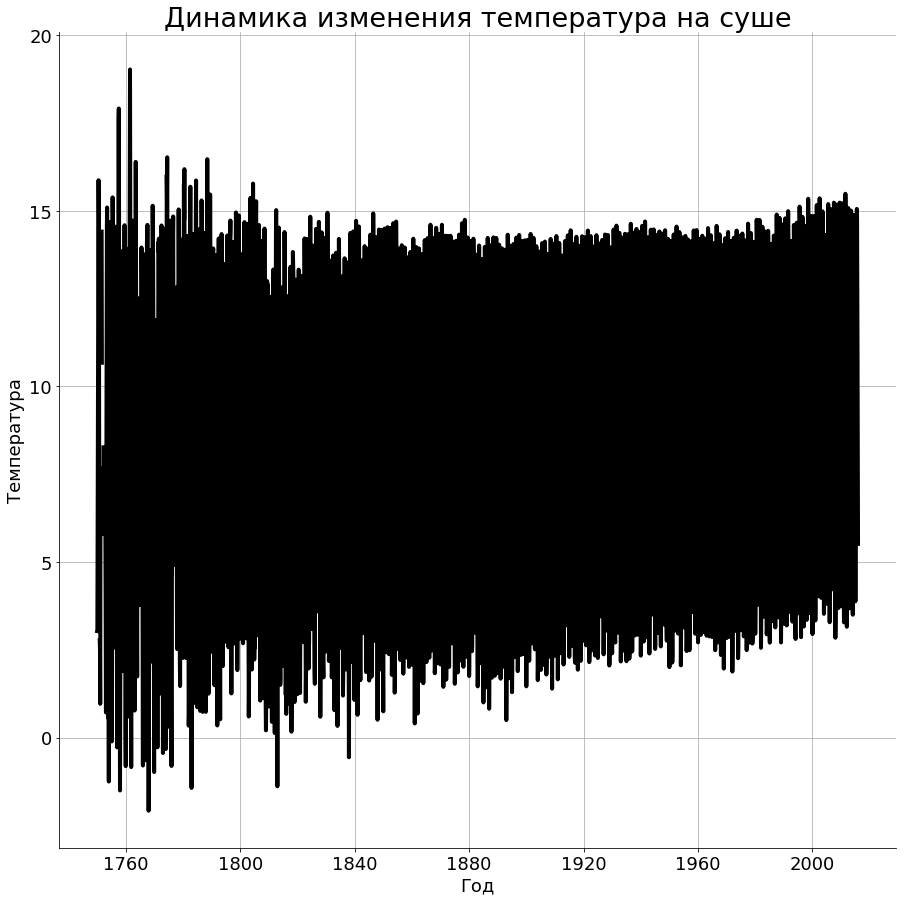

In [6]:
plt.figure(figsize=(15, 15))
ax = plt.subplot(111)
fontsize = 18
roll_step = 1
x = temperature['dt']
y = temperature['LandAverageTemperature'].rolling(roll_step, min_periods=1, center=True).mean()
plt.plot(x, y, linewidth=4, color='k')
plt.title('Динамика изменения температура на суше', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.xlabel('Год', fontsize=fontsize)
plt.ylabel('Температура', fontsize=fontsize);

Сразу возникает вопрос, почему полоса, в которой находятся большинство измерений находится между 0 и 15 градусами. Ответ складывается из двух частей. Первая часть звучит так: здесь представлены усреднённые результаты измерений температуры. Но почему же, в таком случае, среднегодовая температура не равна нулю? Это просто: станции, на которых производятся измерения по Земле распределены не равномерно.

Теперь сделаем глаживание. Посмотрим, как будет выглядеть средний тренд температуры. Пусть $T_i$ - среднемесячная температура в месяц $i$ н.э. $k$ -- длина интервала сглаживания. В таком случае, на участке $\big[i-[\dfrac{k}{2}], i+[\dfrac{k}{2}]\big]$ будем усреднять значение $T_i$. 

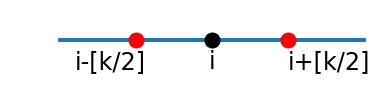

In [7]:
ax = plt.subplot(311)
plt.plot([1,2,3], [0,0,0], linewidth=4)
plt.plot(1.5, 0, 'ro', markersize=15)
plt.plot(2, 0, 'ko', markersize=15)
plt.plot(2.5, 0, 'ro', markersize=15)
plt.text(1.98, -0.05, 'i', fontsize=24)
plt.text(2.5, -0.05, 'i+[k/2]', fontsize=24)
plt.text(1.1, -0.05, 'i-[k/2]', fontsize=24)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.axis('off');

При этом, если для каких-то $i$, $T_i$ незивестно, исключим их из среднего. Если же $i-[\dfrac{k}{2}]$ или $i+[\dfrac{k}{2}]$ находится вне интервала, то будем усреднять только те значения, которые находятся внутри интервала (в таким случае, в граничных случаях, можем иметь $1 + [\dfrac{k}{2}]$ значений для усреднения)


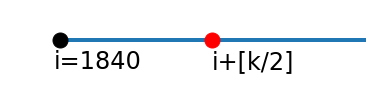

In [8]:
ax = plt.subplot(311)
plt.plot([2,3], [0,0], linewidth=4)
plt.plot(2, 0, 'ko', markersize=15)
plt.plot(2.5, 0, 'ro', markersize=15)
plt.text(1.98, -0.05, 'i=1840', fontsize=24)
plt.text(2.5, -0.05, 'i+[k/2]', fontsize=24)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.axis('off');

In [21]:
def plot_land_avg_temperature(ax, temeperature, roll_step_years, mask_year=None, is_reg_visible=False, is_general_visible=True, delta_reg_year=None, reg_color='r', deg=3):
    fontsize = 18
    roll_step_month = 12
    
    x = temperature['dt']
    y = temperature['LandAverageTemperature'].rolling(roll_step_month * roll_step_years, min_periods=1, center=True).mean()
    
    lr = None
    reg_years_x = None
    if is_general_visible:
        plt.plot(x, y, linewidth=4, color='k')
    if is_reg_visible is not None and mask_year is not None:
        lr = LinearRegression()
        x_reg = PolynomialFeatures(deg).fit_transform(np.array([[i] for i in np.arange(len(x.iloc[mask_year]))]))
        y_reg = np.array(y)[mask_year]
        lr.fit(x_reg, y_reg)
        reg_years_x = x.iloc[mask_year]
    if delta_reg_year is not None and is_reg_visible and mask_year is not None:
        start_year = x.iloc[mask_year].min().year
        finish_year = start_year + x.iloc[mask_year].max().year - x.iloc[mask_year].min().year + 1 + delta_reg_year
        reg_years_x = [datetime(year=cur_year, month=1, day=1) for cur_year in range(start_year, finish_year)]
        x_reg = PolynomialFeatures(deg).fit_transform(
            np.array([[step * 12] for step in np.arange(finish_year - start_year)])
        )
        
    if is_reg_visible:
        plt.plot(reg_years_x, lr.predict(x_reg), linewidth=4, color=reg_color)
    if is_reg_visible or is_general_visible:
        plt.title('Динамика изменения температура на суше (roll = %s year)' % roll_step_years, fontsize=fontsize*1.5)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.grid(True)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
    if delta_reg_year is not None:
        plt.xlim([x.min(), datetime(year=x.max().year + delta_reg_year, month=1, day=1)])
    
    if lr is not None:
        return lr.coef_
    return None

Также, как выше было описано, произведём усреднения по месяцам для 1 года (12 месяцев), 5 и 7 лет соответственно. В результате получим сглаженные графики, на которых будут отражены общие тенденции характерные для температур на суше.

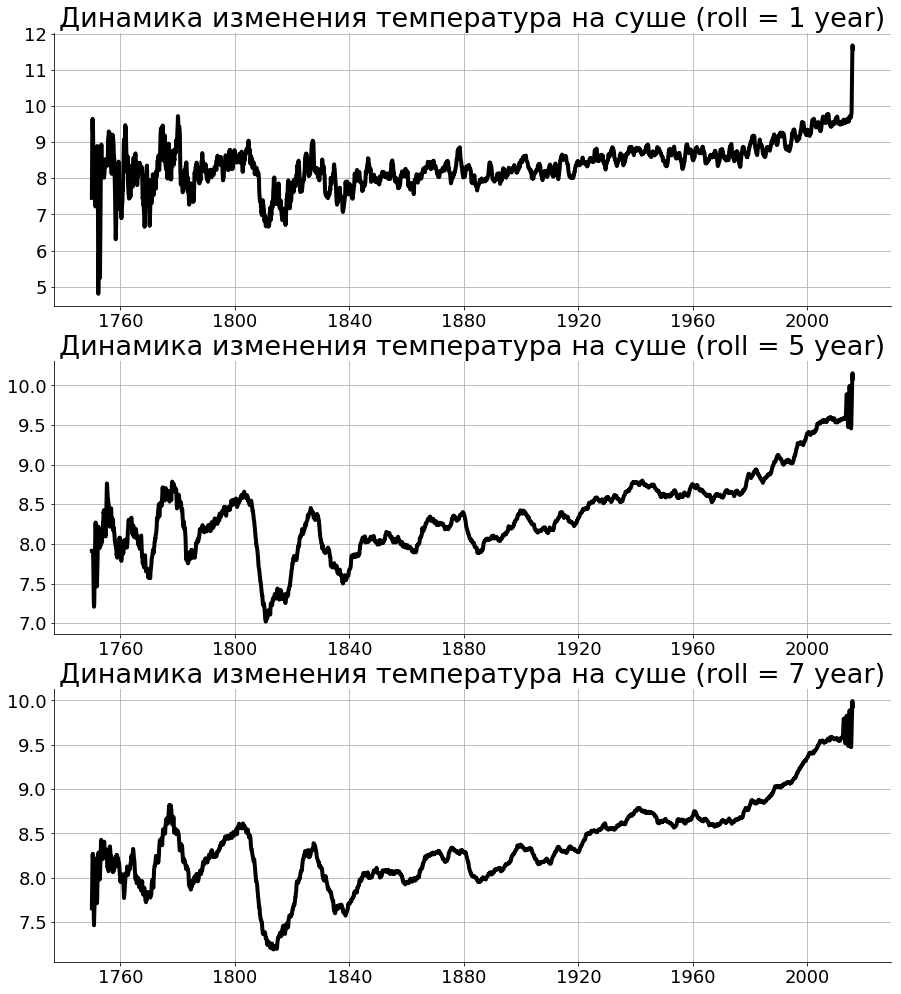

In [22]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(top=1.2)
ax = plt.subplot(311)
plot_land_avg_temperature(ax, temperature, 1, is_reg_visible=False)
ax = plt.subplot(312)
plot_land_avg_temperature(ax, temperature, 5, is_reg_visible=False)
ax = plt.subplot(313)
plot_land_avg_temperature(ax, temperature, 7, is_reg_visible=False);

На этих графиках есть несколько особенностей. 

* Несколько впадин
* Несколько пиков
* Растущая температура
* Осцилляция в 2010-х годах (связана со способом обработки данных при помощи усреднения)
* Большая волотильность (до 1840 года)
* Цикличность (с большим периодом) в температуре с заметным трендом (до 1920 года)
* Цикличность (с маленьким периодом) в температуре

Укажем некоторые из этих особенностей явно. Далее отдельные из них в отдельности и проанализируем. Сразу оговоримся, что осциляции связаны со способом обработки данных и не являются особенностью данных.

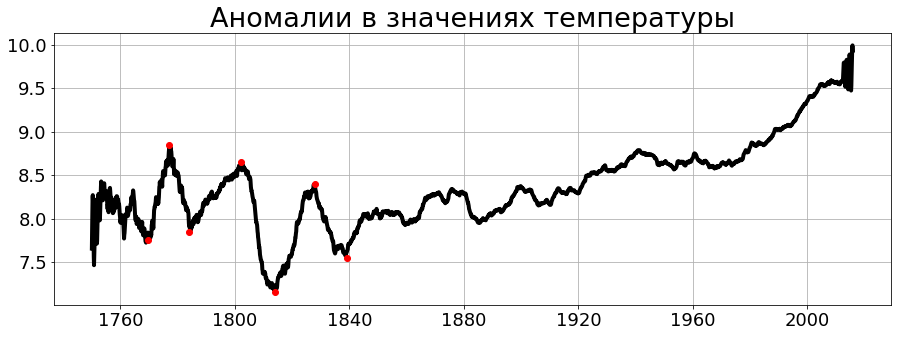

In [23]:
plt.figure(figsize=(15, 5))
plot_land_avg_temperature(ax, temperature, 7, is_reg_visible=False)
plt.title('Аномалии в значениях температуры', fontsize=18 * 1.5)
plt.plot(datetime(year=1769, month=7, day=1), 7.75, 'ro', markersize=6)
plt.plot(datetime(year=1777, month=1, day=1), 8.85, 'ro', markersize=6)
plt.plot(datetime(year=1784, month=1, day=1), 7.85, 'ro', markersize=6)
plt.plot(datetime(year=1802, month=1, day=1), 8.65, 'ro', markersize=6)
plt.plot(datetime(year=1814, month=1, day=1), 7.15, 'ro', markersize=6)
plt.plot(datetime(year=1828, month=1, day=1), 8.40, 'ro', markersize=6)
plt.plot(datetime(year=1839, month=1, day=1), 7.55, 'ro', markersize=6);

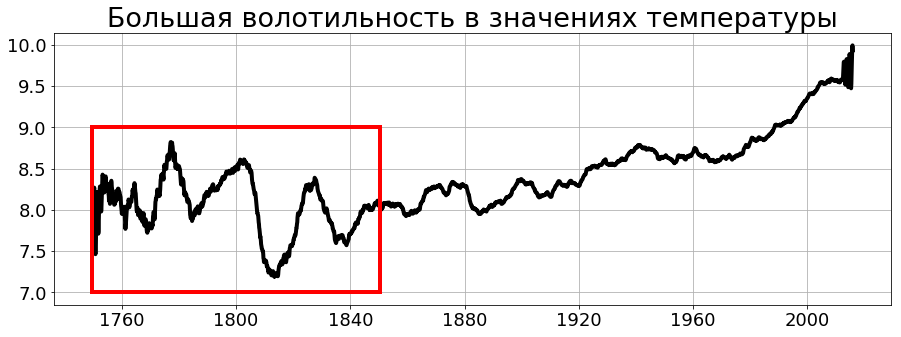

In [24]:
plt.figure(figsize=(15, 5))
plot_land_avg_temperature(ax, temperature, 7, is_reg_visible=False)
plt.title('Большая волотильность в значениях температуры', fontsize=18 * 1.5)
plt.plot([datetime(year=1850, month=7, day=1)] * 2, [7, 9], 'r-', linewidth=4)
plt.plot([datetime(year=1749, month=7, day=1)] * 2, [7, 9], 'r-', linewidth=4)
x_box = [datetime(year=1749, month=7, day=1), datetime(year=1850, month=7, day=1)]
plt.plot(x_box, [7, 7], 'r-', linewidth=4)
plt.plot(x_box, [9, 9], 'r-', linewidth=4);

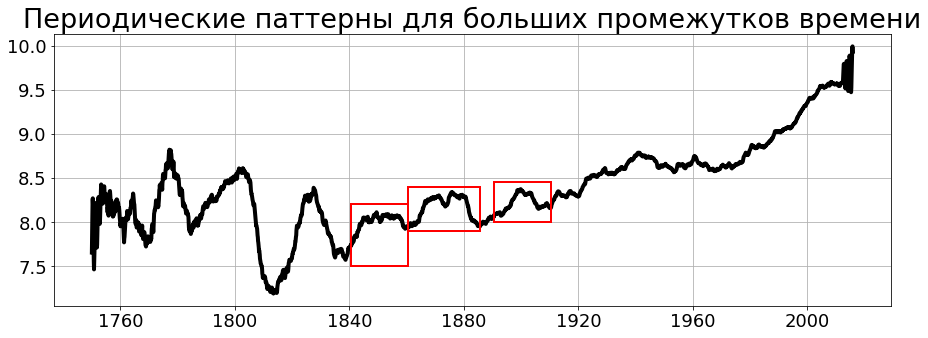

In [25]:
plt.figure(figsize=(15, 5))
plot_land_avg_temperature(ax, temperature, 7, is_reg_visible=False)
plt.title('Периодические паттерны для больших промежутков времени', fontsize=18 * 1.5)

plt.plot([datetime(year=1840, month=7, day=1)] * 2, [7.5, 8.2], 'r-', linewidth=2)
plt.plot([datetime(year=1860, month=7, day=1)] * 2, [7.5, 8.2], 'r-', linewidth=2)
x_box = [datetime(year=1840, month=7, day=1), datetime(year=1860, month=7, day=1)]
plt.plot(x_box, [7.5, 7.5], 'r-', linewidth=2)
plt.plot(x_box, [8.2, 8.2], 'r-', linewidth=2)

plt.plot([datetime(year=1860, month=7, day=1)] * 2, [7.9, 8.4], 'r-', linewidth=2)
plt.plot([datetime(year=1885, month=7, day=1)] * 2, [7.9, 8.4], 'r-', linewidth=2)
x_box = [datetime(year=1860, month=7, day=1), datetime(year=1885, month=7, day=1)]
plt.plot(x_box, [7.9, 7.9], 'r-', linewidth=2)
plt.plot(x_box, [8.4, 8.4], 'r-', linewidth=2)

plt.plot([datetime(year=1890, month=7, day=1)] * 2, [8., 8.45], 'r-', linewidth=2)
plt.plot([datetime(year=1910, month=7, day=1)] * 2, [8., 8.45], 'r-', linewidth=2)
x_box = [datetime(year=1890, month=7, day=1), datetime(year=1910, month=7, day=1)]
plt.plot(x_box, [8., 8.], 'r-', linewidth=2)
plt.plot(x_box, [8.45, 8.45], 'r-', linewidth=2);

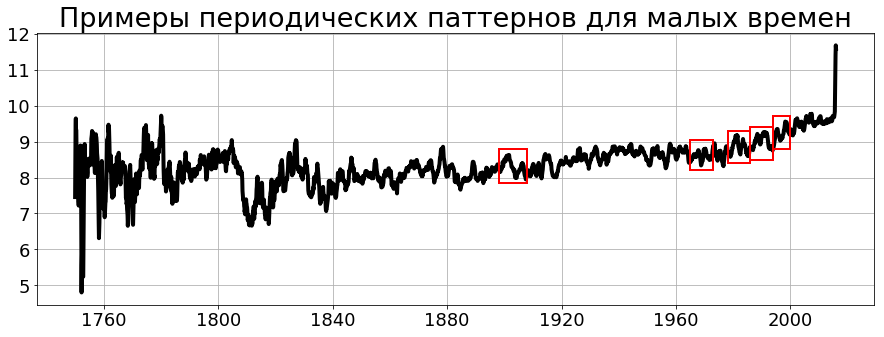

In [26]:
def bbox_plot(year_s, year_f, bottom, top):
    plt.plot([datetime(year=year_s, month=1, day=1)] * 2, [bottom, top], 'r-', linewidth=2)
    plt.plot([datetime(year=year_f, month=1, day=1)] * 2, [bottom, top], 'r-', linewidth=2)
    x_box = [datetime(year=year_s, month=1, day=1), datetime(year=year_f, month=1, day=1)]
    plt.plot(x_box, [bottom] * 2, 'r-', linewidth=2)
    plt.plot(x_box, [top] * 2, 'r-', linewidth=2)
    
plt.figure(figsize=(15, 5))
plot_land_avg_temperature(ax, temperature, 1, is_reg_visible=False)
plt.title('Примеры периодических паттернов для малых времен', fontsize=18 * 1.5)

bbox_plot(1978, 1986, 8.4, 9.3)
bbox_plot(1986, 1994, 8.5, 9.4)
bbox_plot(1994, 2000, 8.8, 9.7)
bbox_plot(1965, 1973, 8.2, 9.05)
bbox_plot(1898, 1908, 7.85, 8.8)

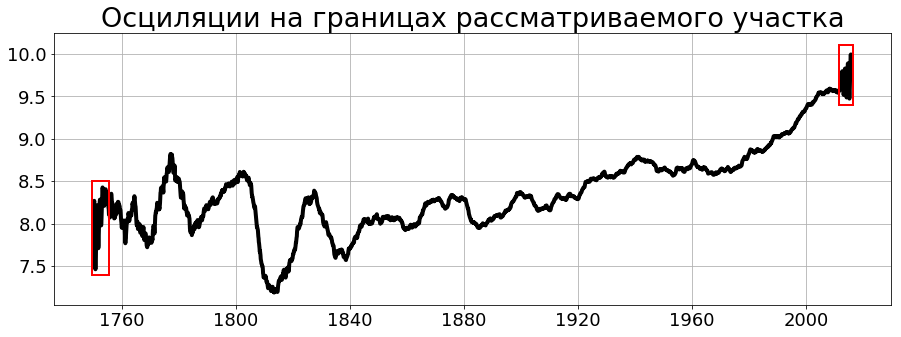

In [27]:
plt.figure(figsize=(15, 5))
plot_land_avg_temperature(ax, temperature, 7, is_reg_visible=False)
plt.title('Осциляции на границах рассматриваемого участка', fontsize=18 * 1.5)

plt.plot([datetime(year=1755, month=7, day=1)] * 2, [7.4, 8.5], 'r-', linewidth=2)
plt.plot([datetime(year=1749, month=7, day=1)] * 2, [7.4, 8.5], 'r-', linewidth=2)
x_box = [datetime(year=1749, month=7, day=1), datetime(year=1755, month=7, day=1)]
plt.plot(x_box, [7.4, 7.4], 'r-', linewidth=2)
plt.plot(x_box, [8.5, 8.5], 'r-', linewidth=2)

plt.plot([datetime(year=2011, month=7, day=1)] * 2, [9.4, 10.1], 'r-', linewidth=2)
plt.plot([datetime(year=2016, month=7, day=1)] * 2, [9.4, 10.1], 'r-', linewidth=2)
x_box = [datetime(year=2011, month=7, day=1), datetime(year=2016, month=7, day=1)]
plt.plot(x_box, [9.4] * 2, 'r-', linewidth=2)
plt.plot(x_box, [10.1] * 2, 'r-', linewidth=2);

# Погрешности измерений

In [ ]:
quantile = 0.95
stats = []
for month_num in range(1, 13):
    count = {}
    sigma = {}
    mean = {}
    filtered_month = city[city['dt'].apply(lambda row: row.month) == month_num].dropna()
    for city_name in tqdm_notebook(cities_names):
        filtered_city = filtered_month[filtered_month['City'] == city_name]
        quantile_val = filtered_city['AverageTemperatureUncertainty'].quantile(quantile)
        less_quantile = filtered_city[filtered_city['AverageTemperatureUncertainty'] < quantile_val]
        count[city_name] = less_quantile['AverageTemperatureUncertainty'].count()
        sigma[city_name] = np.sqrt(less_quantile['AverageTemperatureUncertainty'].var())
        mean[city_name] = less_quantile['AverageTemperatureUncertainty'].mean()
    stats.append({
        'count': count,
        'sigma': sigma,
        'mean': mean,
    })

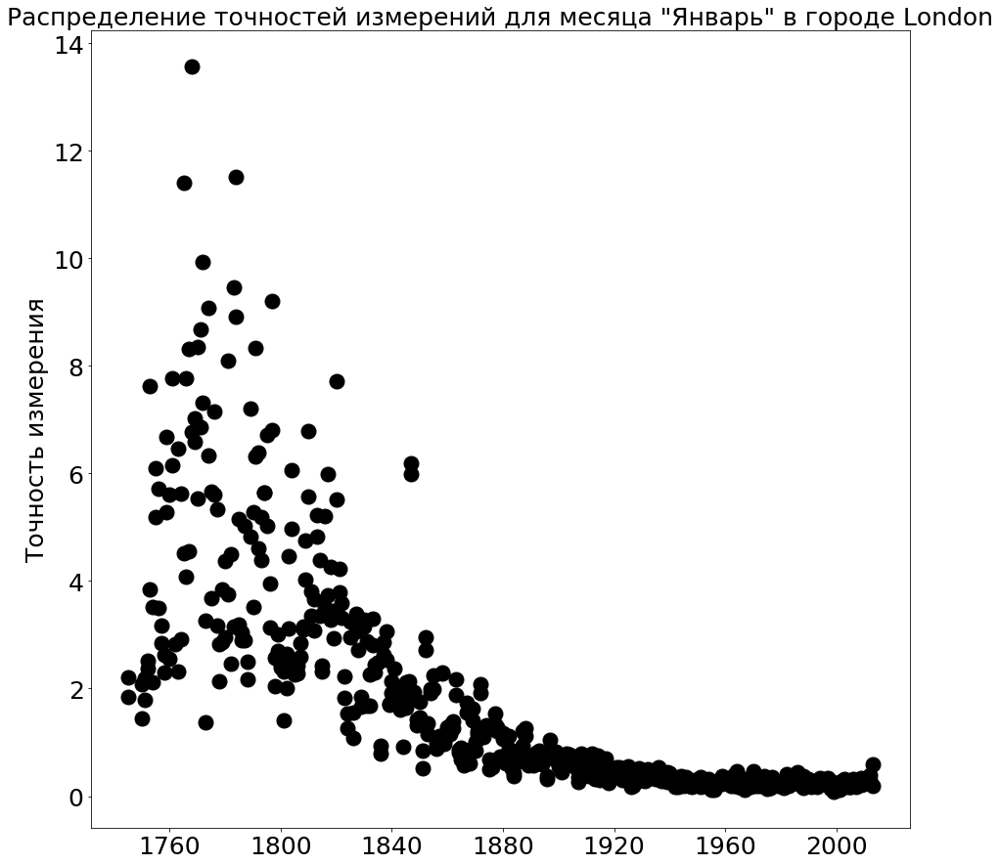

In [66]:
month_name = ['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декарбрь']

month_num = 1
city_name = 'London' # cities_names[250]
filtered = city[city['City'] == city_name]
filtered = filtered[filtered['dt'].apply(lambda row: row.month) == month_num].dropna()
fontsize = 25
plt.figure(figsize=(15, 15))
plt.plot(filtered['dt'][filtered['City'] == city_name], filtered['AverageTemperatureUncertainty'][filtered['City'] == city_name], 'ko', markersize=15);
plt.title('Распределение точностей измерений для месяца "%s" в городе %s' % (month_name[month_num - 1], city_name), fontsize=fontsize)
plt.ylabel('Точность измерения', fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize);

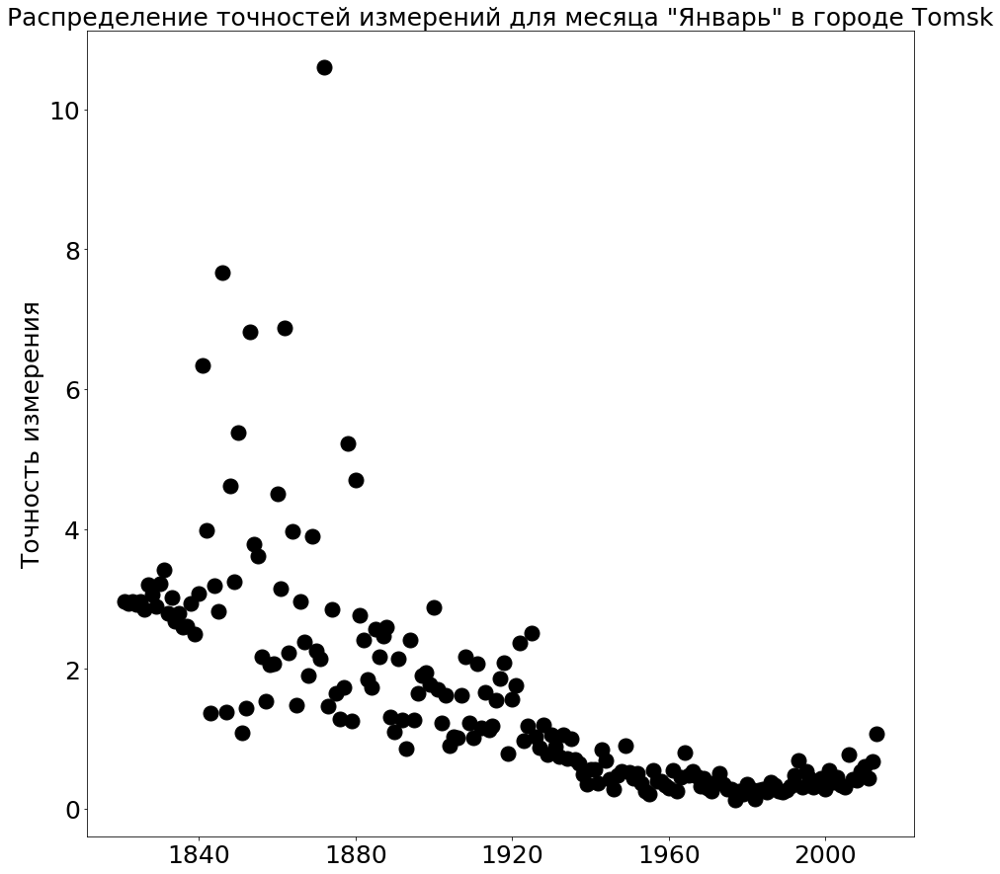

In [67]:
month_name = ['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декарбрь']

month_num = 1
city_name = 'Tomsk' # cities_names[250]
filtered = city[city['City'] == city_name]
filtered = filtered[filtered['dt'].apply(lambda row: row.month) == month_num].dropna()
fontsize = 25
plt.figure(figsize=(15, 15))
plt.plot(filtered['dt'][filtered['City'] == city_name], filtered['AverageTemperatureUncertainty'][filtered['City'] == city_name], 'ko', markersize=15);
plt.title('Распределение точностей измерений для месяца "%s" в городе %s' % (month_name[month_num - 1], city_name), fontsize=fontsize)
plt.ylabel('Точность измерения', fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize);

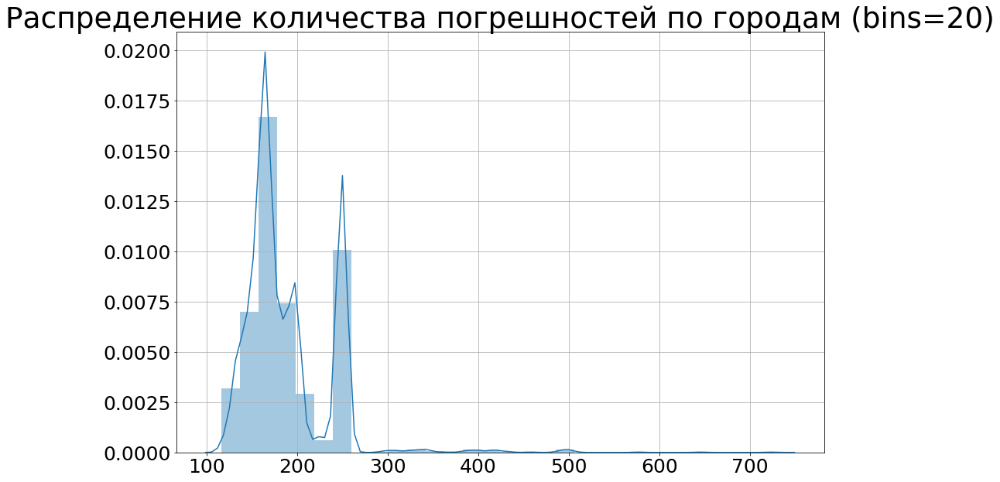

In [68]:
counts = np.array([[item for item in stat['count'].values()] for stat in stats]).flatten()
plt.figure(figsize=(15, 10))
sns.distplot(counts, bins=30)
plt.title('Распределение количества погрешностей по городам (bins=20)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

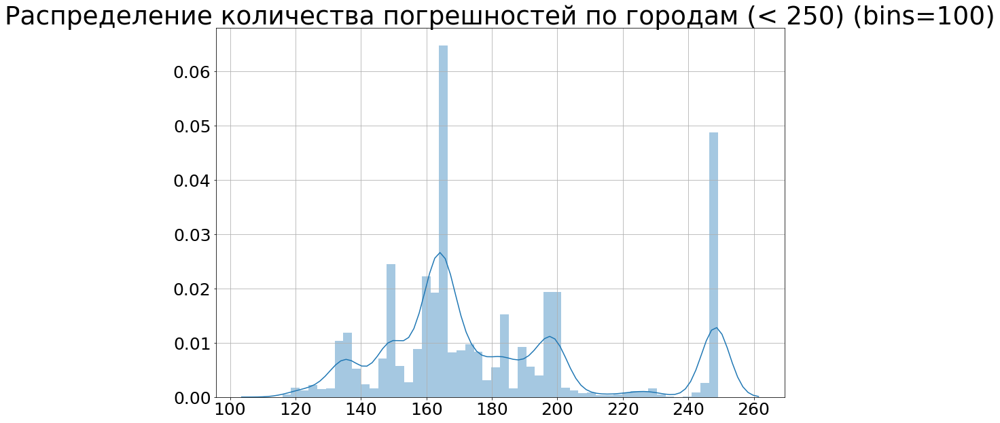

In [69]:
counts = np.array([[item for item in stat['count'].values()] for stat in stats]).flatten()
plt.figure(figsize=(15, 10))
sns.distplot(counts[counts < 250], bins=50)
plt.title('Распределение количества погрешностей по городам (< 250) (bins=100)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

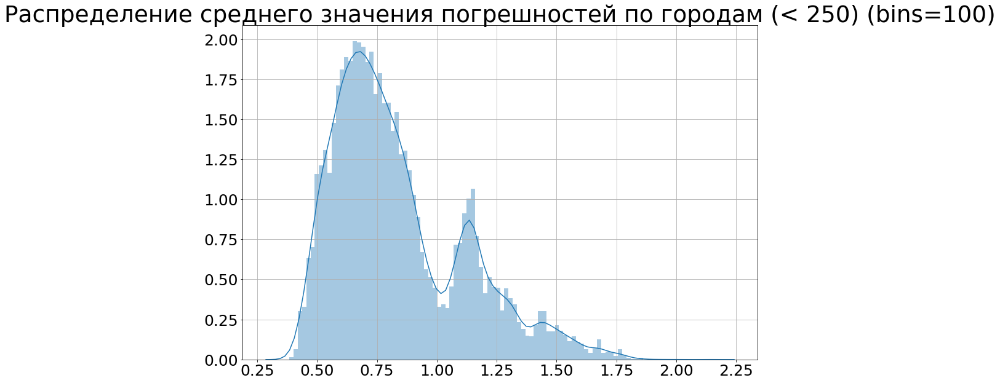

In [70]:
plt.figure(figsize=(15, 10))
counts = np.array([[item for item in stat['mean'].values()] for stat in stats]).flatten()
sns.distplot(counts[counts < 250], bins=100)
plt.title('Распределение среднего значения погрешностей по городам (< 250) (bins=100)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

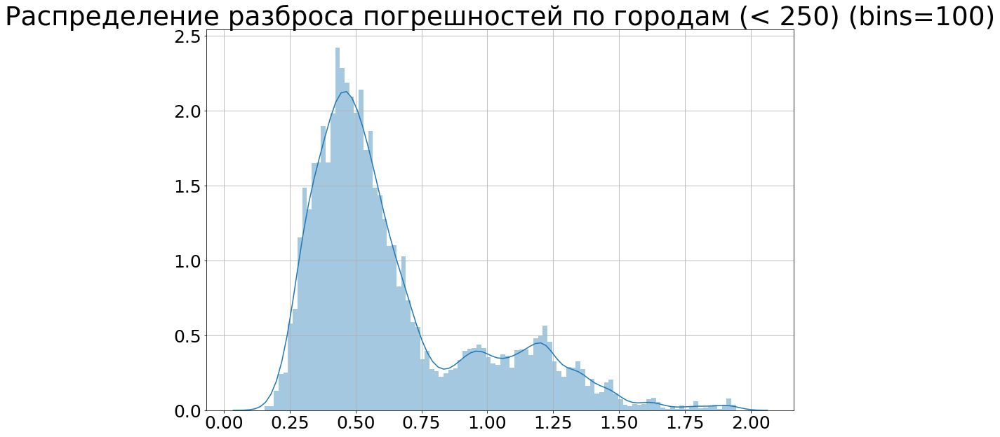

In [71]:
plt.figure(figsize=(15, 10))
counts = np.array([[item for item in stat['sigma'].values()] for stat in stats]).flatten()
sns.distplot(counts[counts < 250], bins=100)
plt.title('Распределение разброса погрешностей по городам (< 250) (bins=100)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

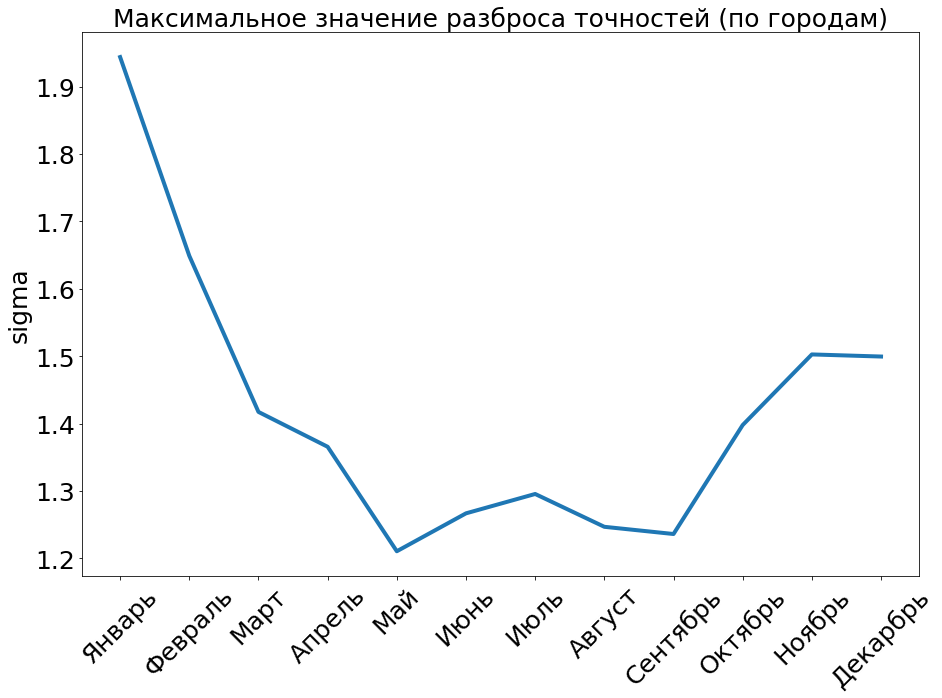

In [75]:
max_sigma = []
for month_number in range(1, 13):
    max_sigma.append(max([value[1] for value in sorted(list(stats[month_number-1]['sigma'].items()), key=lambda x: x[0])]))

month_name = ['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декарбрь']
plt.figure(figsize=(15, 10))
plt.plot(month_name, max_sigma, linewidth=4)
plt.xticks(rotation=45)
plt.ylabel('sigma', fontsize=fontsize)
plt.title('Максимальное значение разброса точностей (по городам)', fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize);

# Так есть ли глобальное потепление?

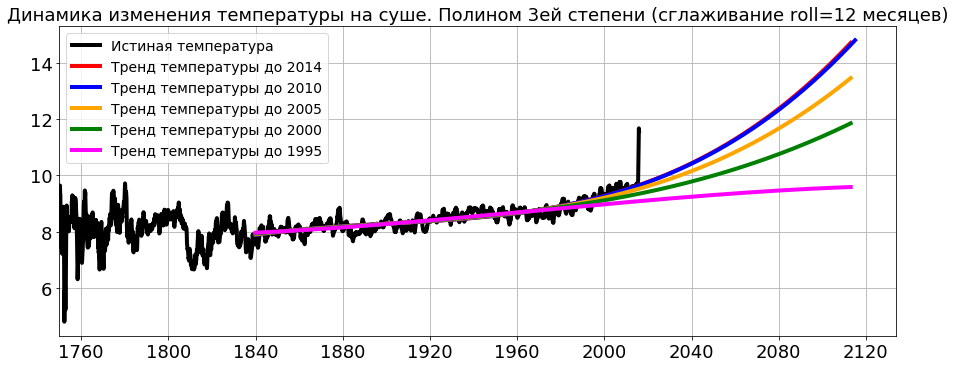

In [83]:
plt.figure(figsize=(15, 4))
plt.subplots_adjust(top=1.2)

start_year = 1840
roll_year = 1
x = temperature['dt']
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2014, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=True, delta_reg_year=100)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2010, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=106, reg_color='blue')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2005, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=109, reg_color='orange')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2000, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=114, reg_color='green')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=1995, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=119, reg_color='magenta')


plt.legend(['Истиная температура', 'Тренд температуры до 2014', 'Тренд температуры до 2010', 'Тренд температуры до 2005', 'Тренд температуры до 2000', 'Тренд температуры до 1995'], fontsize=14)
plt.title('Динамика изменения температуры на суше. Полином 3ей степени (сглаживание roll=12 месяцев)', fontsize=18);

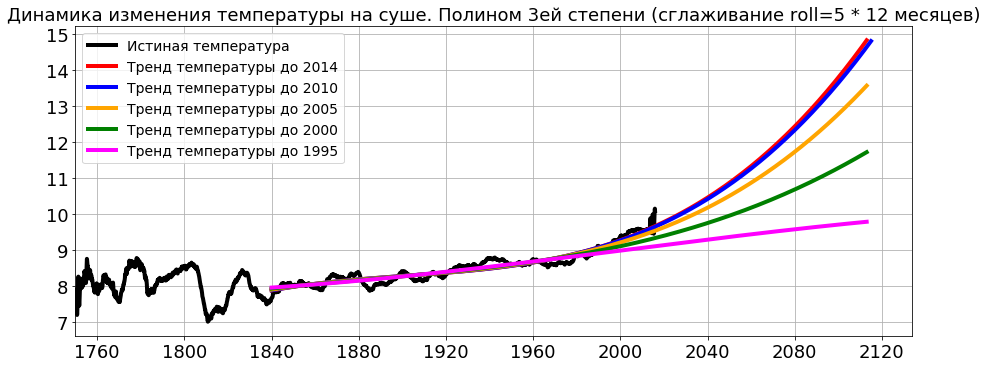

In [81]:
plt.figure(figsize=(15, 4))
plt.subplots_adjust(top=1.2)

start_year = 1840
roll_year = 5
x = temperature['dt']
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2014, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=True, delta_reg_year=100)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2010, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=106, reg_color='blue')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2005, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=109, reg_color='orange')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2000, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=114, reg_color='green')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=1995, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=119, reg_color='magenta')


plt.legend(['Истиная температура', 'Тренд температуры до 2014', 'Тренд температуры до 2010', 'Тренд температуры до 2005', 'Тренд температуры до 2000', 'Тренд температуры до 1995'], fontsize=14)
plt.title('Динамика изменения температуры на суше. Полином 3ей степени (сглаживание roll=5 * 12 месяцев)', fontsize=18);

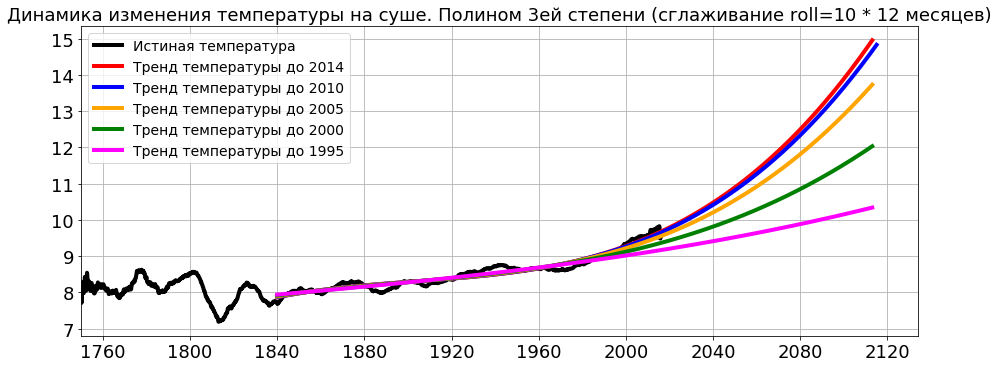

In [82]:
plt.figure(figsize=(15, 4))
plt.subplots_adjust(top=1.2)

start_year = 1840
roll_year = 10
x = temperature['dt']
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2014, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=True, delta_reg_year=100)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2010, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=106, reg_color='blue')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2005, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=109, reg_color='orange')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2000, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=114, reg_color='green')
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=1995, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=119, reg_color='magenta')


plt.legend(['Истиная температура', 'Тренд температуры до 2014', 'Тренд температуры до 2010', 'Тренд температуры до 2005', 'Тренд температуры до 2000', 'Тренд температуры до 1995'], fontsize=14)
plt.title('Динамика изменения температуры на суше. Полином 3ей степени (сглаживание roll=10 * 12 месяцев)', fontsize=18);

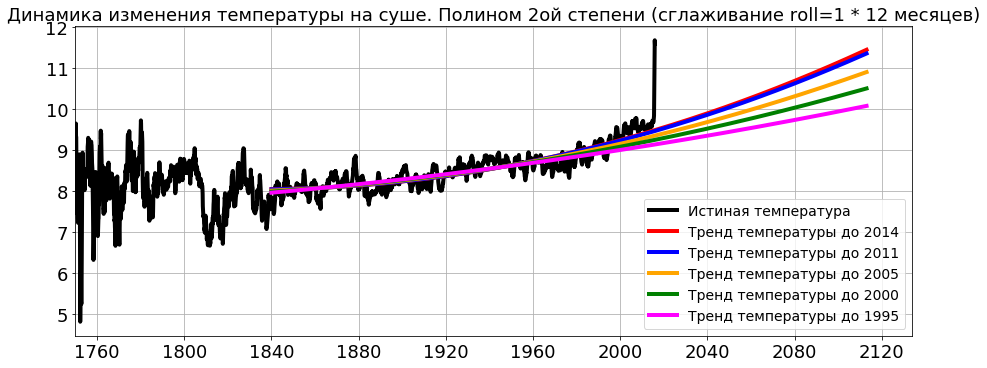

In [84]:
plt.figure(figsize=(15, 4))
plt.subplots_adjust(top=1.2)

start_year = 1840
roll_year = 1
x = temperature['dt']
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2014, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=True, delta_reg_year=100, deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2011, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=103, reg_color='blue', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2005, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=109, reg_color='orange', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2000, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=114, reg_color='green', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=1995, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=119, reg_color='magenta', deg=2)


plt.legend(['Истиная температура', 'Тренд температуры до 2014', 'Тренд температуры до 2011', 'Тренд температуры до 2005', 'Тренд температуры до 2000', 'Тренд температуры до 1995'], fontsize=14)
plt.title('Динамика изменения температуры на суше. Полином 2ой степени (сглаживание roll=1 * 12 месяцев)', fontsize=18);

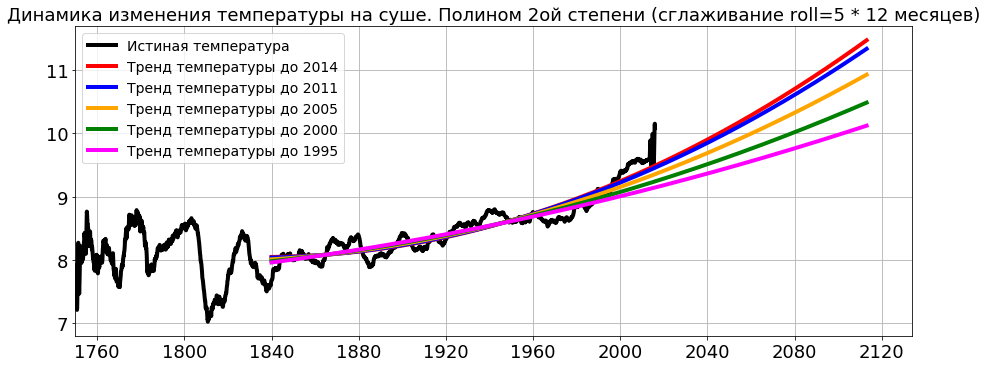

In [85]:
plt.figure(figsize=(15, 4))
plt.subplots_adjust(top=1.2)

start_year = 1840
roll_year = 5
x = temperature['dt']
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2014, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=True, delta_reg_year=100, deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2011, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=103, reg_color='blue', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2005, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=109, reg_color='orange', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2000, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=114, reg_color='green', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=1995, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=119, reg_color='magenta', deg=2)


plt.legend(['Истиная температура', 'Тренд температуры до 2014', 'Тренд температуры до 2011', 'Тренд температуры до 2005', 'Тренд температуры до 2000', 'Тренд температуры до 1995'], fontsize=14)
plt.title('Динамика изменения температуры на суше. Полином 2ой степени (сглаживание roll=5 * 12 месяцев)', fontsize=18);

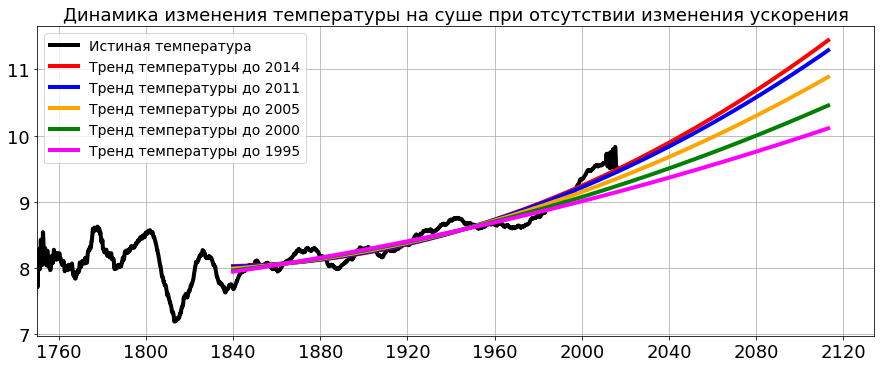

In [138]:
plt.figure(figsize=(15, 4))
plt.subplots_adjust(top=1.2)

start_year = 1840
roll_year = 10
x = temperature['dt']
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2014, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=True, delta_reg_year=100, deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2011, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=103, reg_color='blue', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2005, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=109, reg_color='orange', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=2000, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=114, reg_color='green', deg=2)
mask_year = np.where((x > datetime(year=start_year, day=1, month=1)) & (x < datetime(year=1995, day=1, month=1)))
plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_general_visible=False, is_reg_visible=True, delta_reg_year=119, reg_color='magenta', deg=2)


plt.legend(['Истиная температура', 'Тренд температуры до 2014', 'Тренд температуры до 2011', 'Тренд температуры до 2005', 'Тренд температуры до 2000', 'Тренд температуры до 1995'], fontsize=14)
plt.title('Динамика изменения температуры на суше. Полином 2ой степени (сглаживание roll=10 * 12 месяцев)', fontsize=18);

# Параметризуем по коэффициентам регрессии

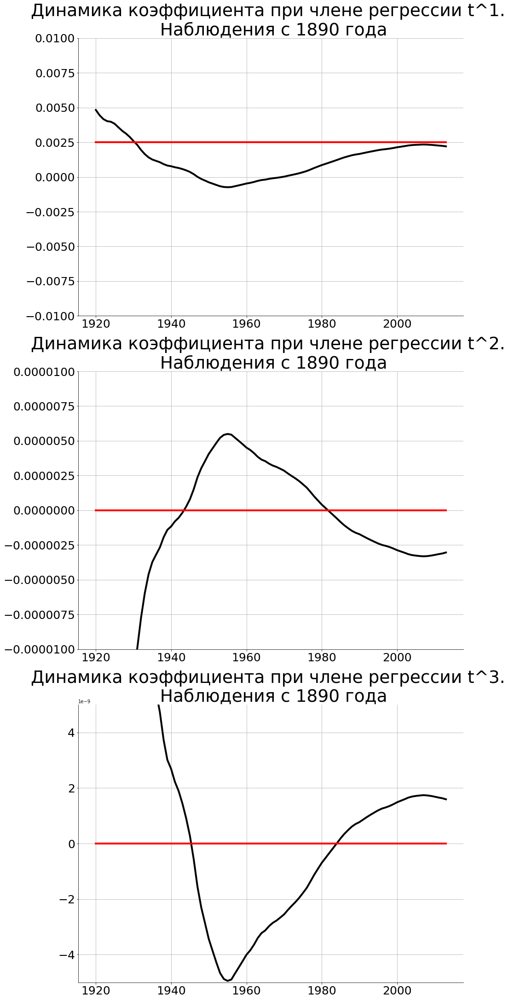

In [95]:
coefs_ = []
deg = 3
roll_year = 10
a = 1890
b = 2014
history_interval = 30
x = temperature['dt']
for last_year in range(a + history_interval, b):
    mask_year = np.where((x > datetime(year=a, day=1, month=1)) & (x < datetime(year=last_year, day=1, month=1)))
    coefs_.append(plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=False, is_general_visible=False, deg=deg))
x_arg = [datetime(year=year, month=1, day=1) for year in range(a + history_interval, b)]

plt.figure(figsize=(15, 12))
plt.subplots_adjust(top=2.5)

ax = plt.subplot(311)
plt.plot(x_arg, np.array(coefs_)[:, 1], linewidth=4, color='k')
plt.plot(x_arg, [0.0025] * len(x_arg), linewidth=4, color='r')
plt.title('Динамика коэффициента при члене регрессии t^1. \n Наблюдения с %d года' % a, fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.ylim([-0.01, 0.01])

ax = plt.subplot(312)
plt.plot(x_arg, np.array(coefs_)[:, 2], linewidth=4, color='k')
plt.plot(x_arg, [0.0] * len(x_arg), linewidth=4, color='r')
plt.title('Динамика коэффициента при члене регрессии t^2. \n Наблюдения с %d года' % a, fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.ylim([-10e-6, 10e-6])

ax = plt.subplot(313)
plt.plot(x_arg, np.array(coefs_)[:, 3], linewidth=4, color='k')
plt.title('Динамика коэффициента при члене регрессии t^3. \n Наблюдения с %d года' % a, fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.plot(x_arg, [0.0] * len(x_arg), linewidth=4, color='r')
plt.ylim([-5e-9, 5e-9]);

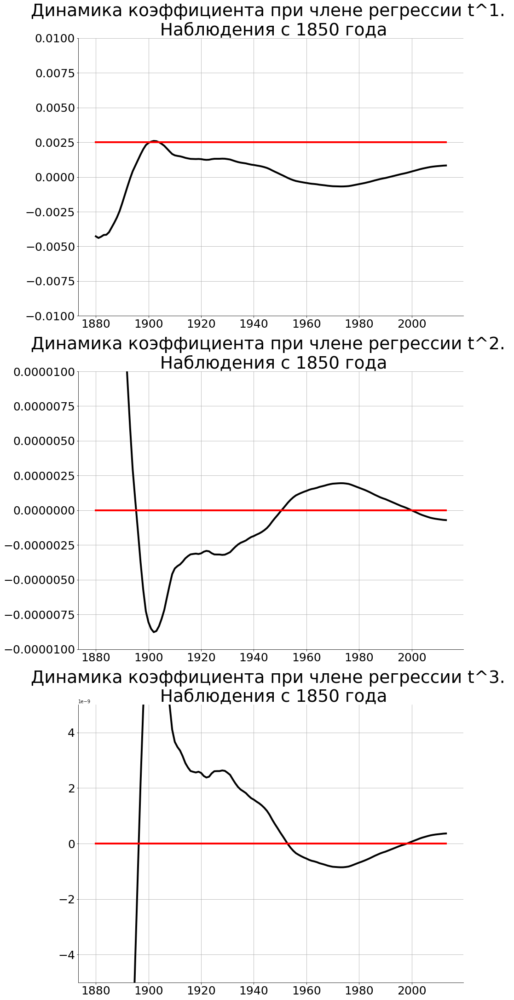

In [94]:
coefs_ = []
deg = 3
roll_year = 10
a = 1850
b = 2014
history_interval = 30
x = temperature['dt']
for last_year in range(a + history_interval, b):
    mask_year = np.where((x > datetime(year=a, day=1, month=1)) & (x < datetime(year=last_year, day=1, month=1)))
    coefs_.append(plot_land_avg_temperature(ax, temperature, roll_year, mask_year, is_reg_visible=False, is_general_visible=False, deg=deg))
x_arg = [datetime(year=year, month=1, day=1) for year in range(a + history_interval, b)]

plt.figure(figsize=(15, 12))
plt.subplots_adjust(top=2.5)

ax = plt.subplot(311)
plt.plot(x_arg, np.array(coefs_)[:, 1], linewidth=4, color='k')
plt.plot(x_arg, [0.0025] * len(x_arg), linewidth=4, color='r')
plt.title('Динамика коэффициента при члене регрессии t^1. \n Наблюдения с %d года' % a, fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.ylim([-0.01, 0.01])

ax = plt.subplot(312)
plt.plot(x_arg, np.array(coefs_)[:, 2], linewidth=4, color='k')
plt.plot(x_arg, [0.0] * len(x_arg), linewidth=4, color='r')
plt.title('Динамика коэффициента при члене регрессии t^2. \n Наблюдения с %d года' % a, fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.ylim([-10e-6, 10e-6])

ax = plt.subplot(313)
plt.plot(x_arg, np.array(coefs_)[:, 3], linewidth=4, color='k')
plt.title('Динамика коэффициента при члене регрессии t^3. \n Наблюдения с %d года' % a, fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.plot(x_arg, [0.0] * len(x_arg), linewidth=4, color='r')
plt.ylim([-5e-9, 5e-9]);

# Изучим вопрос засухи и холодов

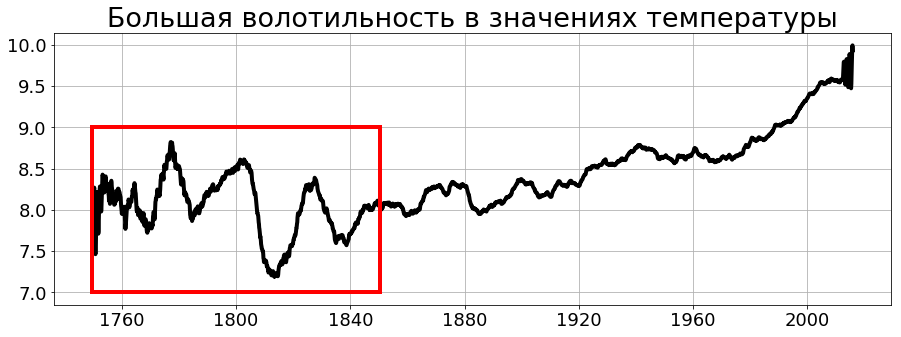

In [30]:
plt.figure(figsize=(15, 5))
plot_land_avg_temperature(ax, temperature, 7, is_reg_visible=False)
plt.title('Большая волотильность в значениях температуры', fontsize=18 * 1.5)
plt.plot([datetime(year=1850, month=7, day=1)] * 2, [7, 9], 'r-', linewidth=4)
plt.plot([datetime(year=1749, month=7, day=1)] * 2, [7, 9], 'r-', linewidth=4)
x_box = [datetime(year=1749, month=7, day=1), datetime(year=1850, month=7, day=1)]
plt.plot(x_box, [7, 7], 'r-', linewidth=4)
plt.plot(x_box, [9, 9], 'r-', linewidth=4);

Во некоторых источниках упоминается про пожары, холода и другие катаклизмы в отмеченные периоды. Посмотрим, что же на самом деле

Изучим вопрос засухи и аномального холода в 1700-1800 годах. Легко отыскать в интернете, что в 1810-х - 1820-х годах была аномально холодная зима. С этим связано также несколько события, которые повлияли на ход истории. 

https://sibved.livejournal.com/81182.html (автор немного пароноидален, но упоминает о странных холодах по миру)
https://ru.wikipedia.org/wiki/%D0%9C%D0%B0%D0%BB%D1%8B%D0%B9_%D0%BB%D0%B5%D0%B4%D0%BD%D0%B8%D0%BA%D0%BE%D0%B2%D1%8B%D0%B9_%D0%BF%D0%B5%D1%80%D0%B8%D0%BE%D0%B4 (1740, 1780 и 1820 что явно видно на графике)

Стоит отметить, что в период между сильными похолоданиями, наблюдались сильные засухи, которые часто усугубляли различного рода события внутри разных стран (https://en.wikipedia.org/wiki/Irish_Famine_(1740%E2%80%9341) , https://agupubs.onlinelibrary.wiley.com/doi/pdf/10.1029/2003EO490001 , 
https://www.researchgate.net/publication/248885479_Fire_scars_reveal_source_of_New_England's_1780_Dark_Day/download)

Коль скоро, интерес представляют отдельные промежутки времени, рассмотрим, какая температура наблюдалась в различных точках планеты. Для этого сделаем визуализация по городам для различных временных интервалов

Выберем годы с минимальной и максимальной температурой. Построим для них тепловые карты. В результате, станет очевидно, что, действительно, ряд лет наблюдались катаклизмы в тех или иных областях. При этом, особенно остро эта разница заметна летом. Из этого следует, что катаклизмы, происходившие в в ряде государств могли быть связаны (или даже вызваны) такими природными аномалиями.

Данный эксперимент проведён не совсем честно, поскольку сравниваются распределения для нетипично жарких годов и нетипично холодных годов. Но опыты показывают, что в рамках этих периодов наблюдаются аномалии

In [31]:
def plotly_map_temperature(groupped_cities, title):
    data = [ dict(
            type = 'scattergeo',
            lon = groupped_cities['lon'],
            lat = groupped_cities['lat'],
            text = groupped_cities.index,
            mode = 'markers',
            marker = dict(
                size = 5,
                reversescale = False,
                autocolorscale = False,
                symbol = 'circle',
                color = groupped_cities['AverageTemperature'],
                cmax = groupped_cities['AverageTemperature'].max(),
                cmin = groupped_cities['AverageTemperature'].min(),
                colorbar=dict(title="Температура в градусах цельсия")
            ))]

    layout = dict(
        title=title,
    )

    py.iplot(dict(data=data, layout=layout))

In [32]:
summer_mask = (city['dt'].apply(lambda row: row.month == 6 or row.month == 7 or row.month == 8))
winter_mask = (city['dt'].apply(lambda row: row.month == 1 or row.month == 2 or row.month == 12))

def filter_period(cold_start_year, cold_finish_year, warm_start_year, warm_finish_year, season_mask):
    mask = (city['dt'] >= datetime(year=warm_start_year, day=1, month=1)) & \
        (city['dt'] <= datetime(year=warm_finish_year, day=1, month=1)) & (season_mask)
    groupped_cities_hot = pd.DataFrame(city[mask].groupby('City')['AverageTemperature'].mean().sort_index())
    groupped_cities_hot['lat'] = city_coords['lat']
    groupped_cities_hot['lon'] = city_coords['lon']

    mask = (city['dt'] >= datetime(year=cold_start_year, day=1, month=1)) & \
        (city['dt'] <= datetime(year=cold_finish_year, day=1, month=1)) & (season_mask)
    groupped_cities_cold = pd.DataFrame(city[mask].groupby('City')['AverageTemperature'].mean().sort_index())
    groupped_cities_cold['lat'] = city_coords['lat']
    groupped_cities_cold['lon'] = city_coords['lon']

    groupped_cities_diff = groupped_cities_cold.copy(deep=True)
    groupped_cities_diff['AverageTemperature'] = groupped_cities_hot['AverageTemperature'] - groupped_cities_cold['AverageTemperature']
    
    return groupped_cities_hot, groupped_cities_cold, groupped_cities_diff

In [46]:
def plot_extreme_temperature(max_temp_diff, min_temp_diff, start_year, finish_year, step_year, season_title):
    plt.figure(figsize=(15, 12))
    plt.subplots_adjust(top=1.3)
    rolling_step = 10
    fontsize = 18
    
    ax = plt.subplot(211)
    temp_df_ = pd.DataFrame()
    temp_df_['Temperature'] = max_temp_diff
    plt.plot(range(start_year, finish_year), max_temp_diff, linewidth=4, color='k')
    plt.plot(range(start_year, finish_year), temp_df_.rolling(rolling_step, min_periods=1, center=True).mean(), color='red', linewidth=4)
    plt.title('Максимальная аномальная температура на Земле %s. Разница между годами: x и x+%d' % (season_title, step_year), fontsize=fontsize*1.5)
    plt.xlabel('Год', fontsize=fontsize*1.2)
    plt.ylabel('Температура', fontsize=fontsize*1.2)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.grid(True)
    plt.legend(['Истиная температура', 'Сглаженная температура с шагом %d' % rolling_step], fontsize=fontsize*1.2)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    
    ax = plt.subplot(212)
    temp_df_ = pd.DataFrame()
    temp_df_['Temperature'] = min_temp_diff
    plt.plot(range(start_year, finish_year), min_temp_diff, linewidth=4, color='k')
    plt.plot(range(start_year, finish_year), temp_df_.rolling(rolling_step, min_periods=1, center=True).mean(), linewidth=4, color='red')
    plt.title('Минимальная аномальная температура на Земле %s. Разница между годами: x и x+%d' % (season_title, step_year), fontsize=fontsize*1.5)
    plt.xlabel('Год', fontsize=fontsize*1.2)
    plt.ylabel('Температура', fontsize=fontsize*1.2)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.grid(True)
    plt.legend(['Истиная температура', 'Сглаженная температура с шагом %d' % rolling_step], fontsize=fontsize*1.2)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
def calc_and_plot_extreme_temperature(season_mask, season_title, start_year=1750, finish_year=2013, step_year=1, count_elements=1):
    max_temp_diff = []
    min_temp_diff = []
    for year in tqdm_notebook(range(start_year, finish_year)):
        _, _, diff_temperatures = filter_period(year, year+1, year+step_year, year+step_year+1, season_mask)
        
        diff_avg_temp = diff_temperatures.dropna()['AverageTemperature'].sort_values()
        max_temp_diff.append(diff_avg_temp.iloc[-count_elements:].mean())
        min_temp_diff.append(diff_avg_temp.iloc[:count_elements].mean())
    plot_extreme_temperature(max_temp_diff, min_temp_diff, start_year, finish_year, step_year, season_title)

In [47]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = failure_filter_period(1809, 1814, 1800, 1804, winter_mask)

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для зим 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для зим 1809--1814')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для зим 1809--1814 и 1800--1804')

In [48]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1809, 1814, 1800, 1804, summer_mask)

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для летних периодов 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для летних периодов 1809--1814')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для летних периодов 1809--1814 и 1800--1804')

А теперь посмотрим, что происходило за весь период наблюдения для различных уровней сглаживания

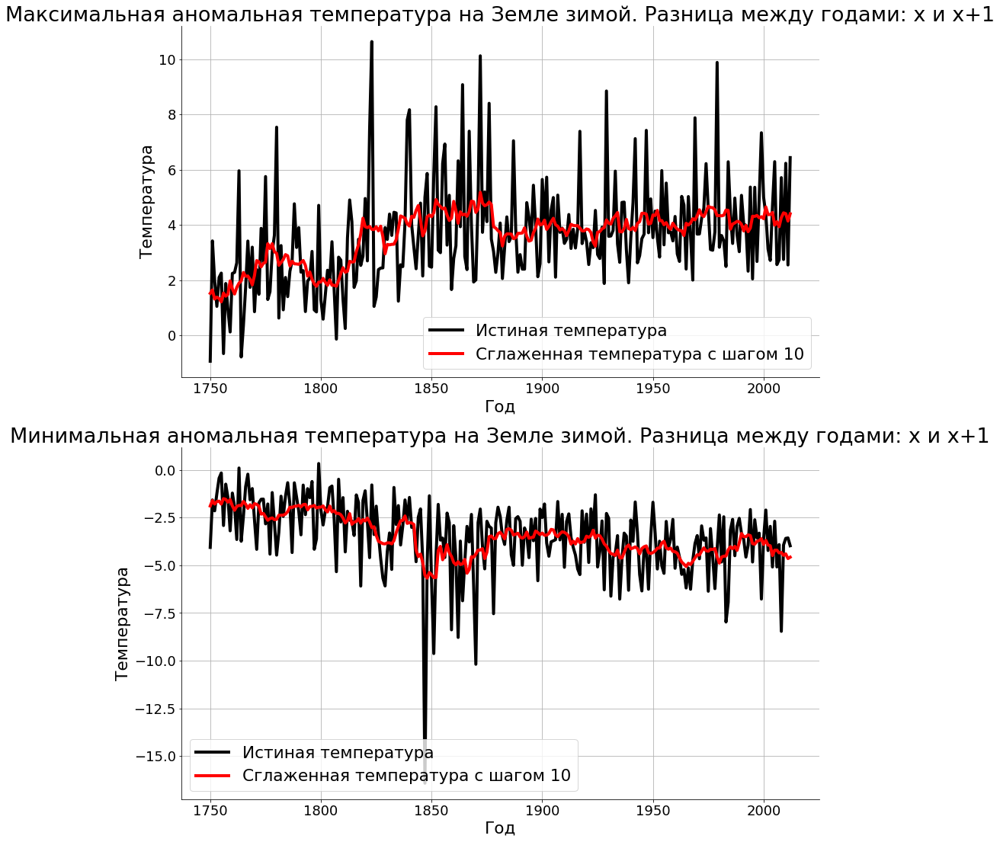

In [49]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 1)

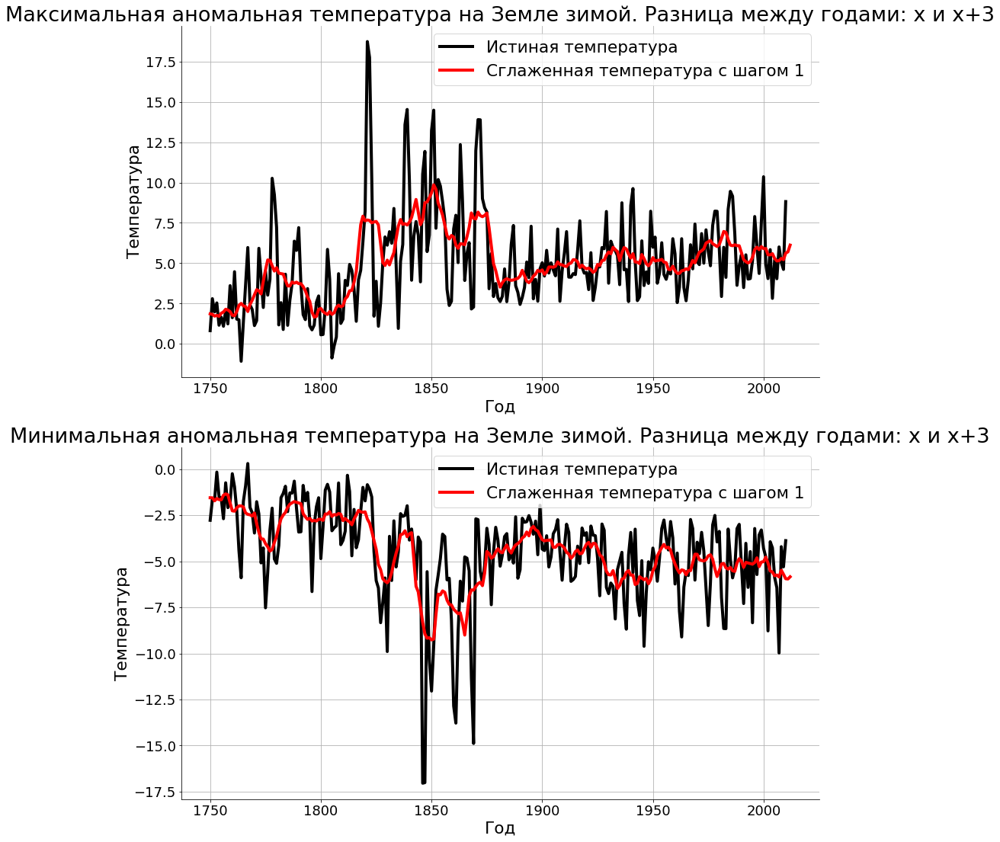

In [175]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 3, 1)

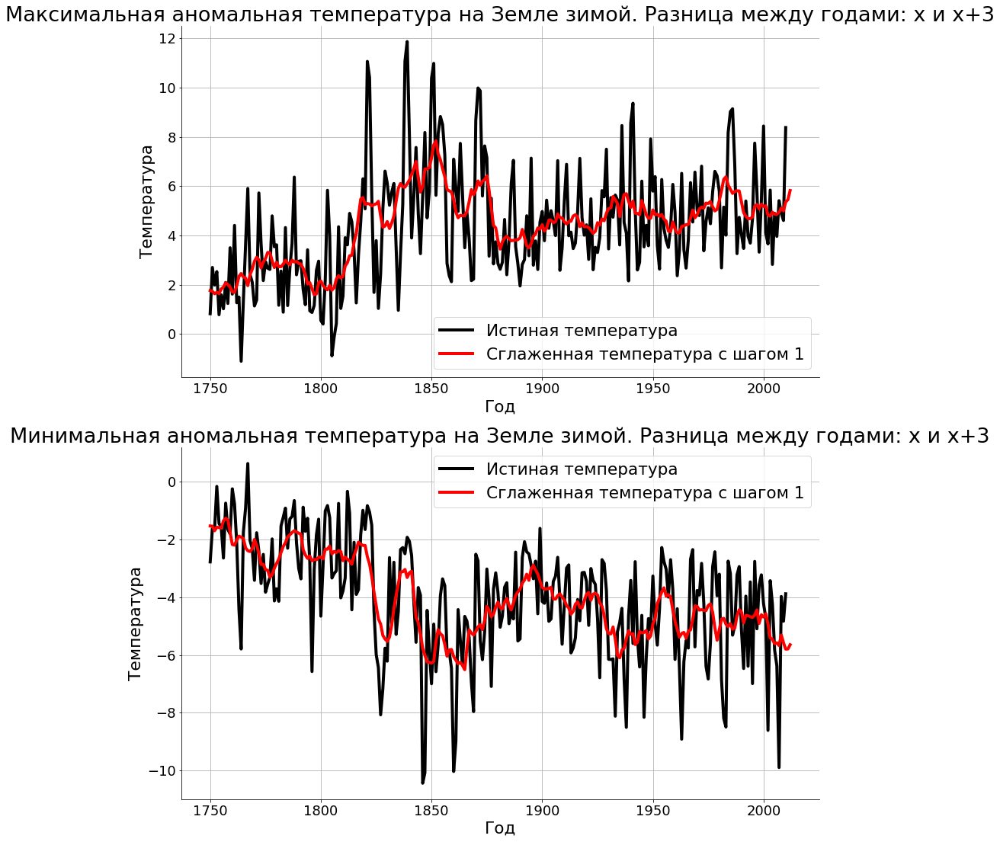

In [174]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 3, 3)

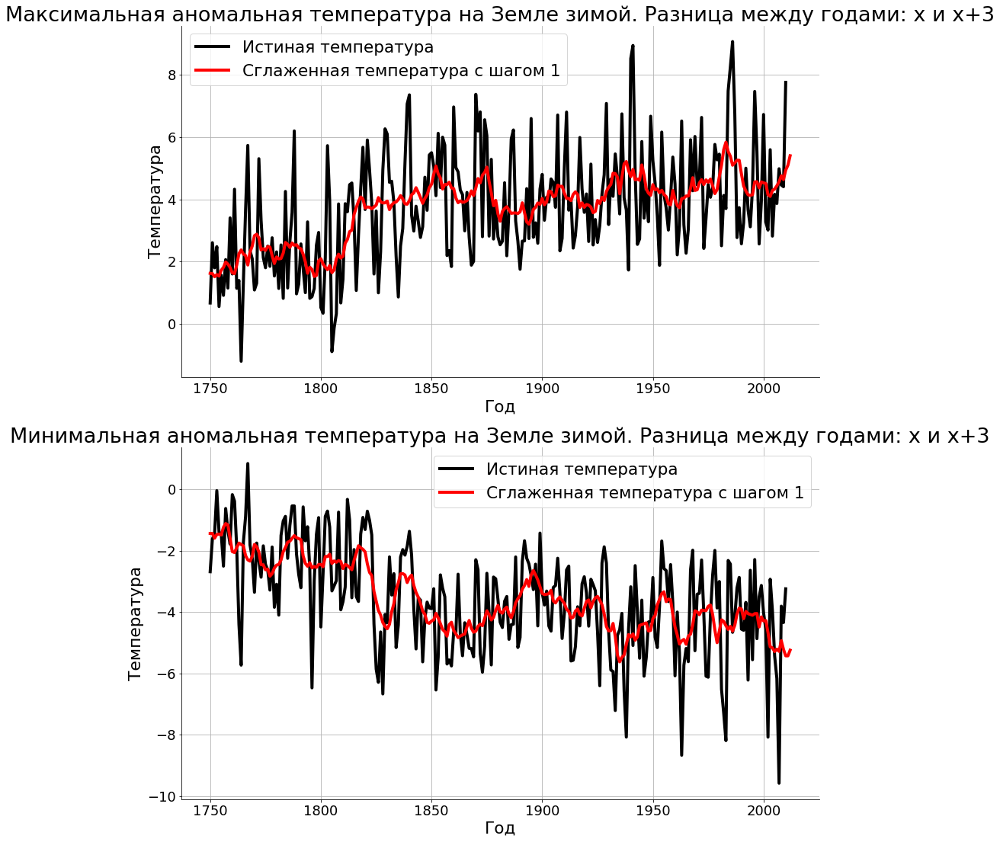

In [176]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 3, 10)

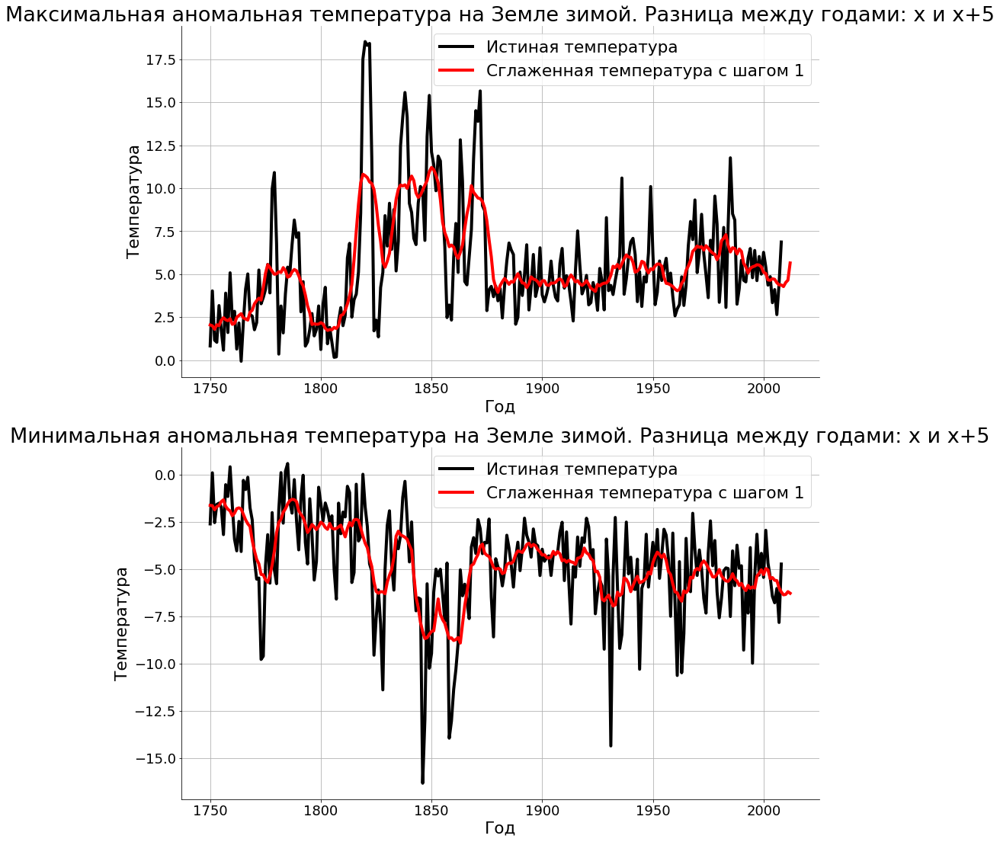

In [177]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 5, 1)

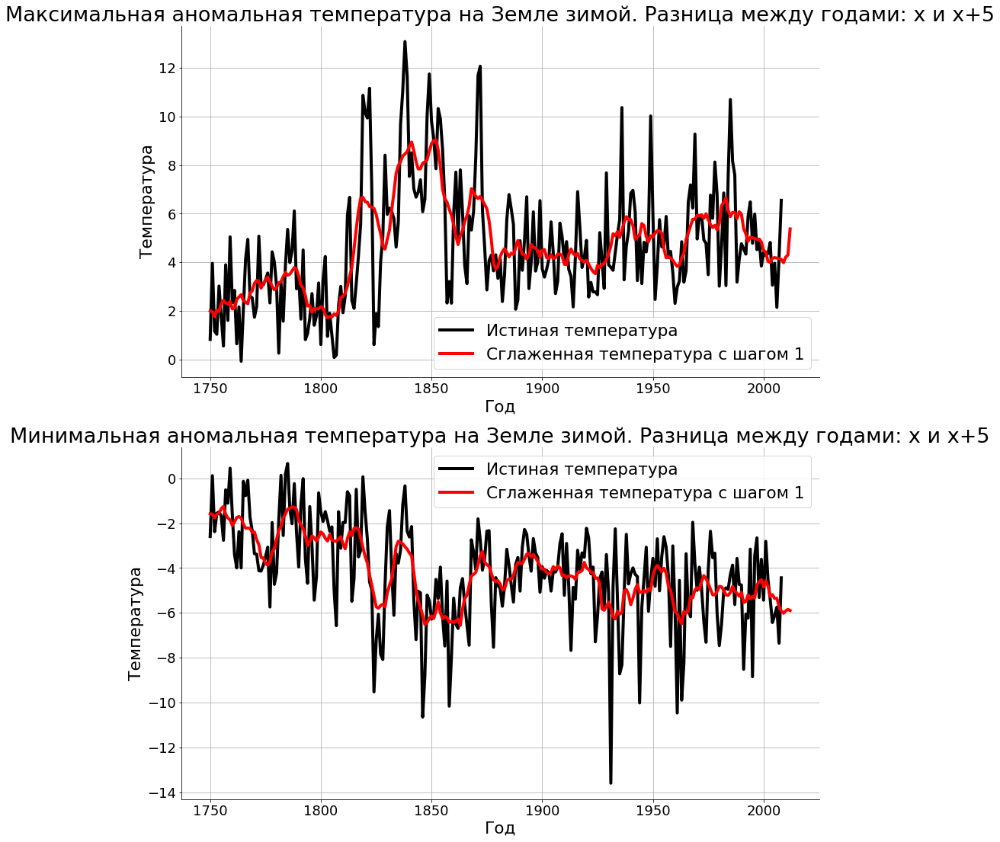

In [178]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 5, 3)

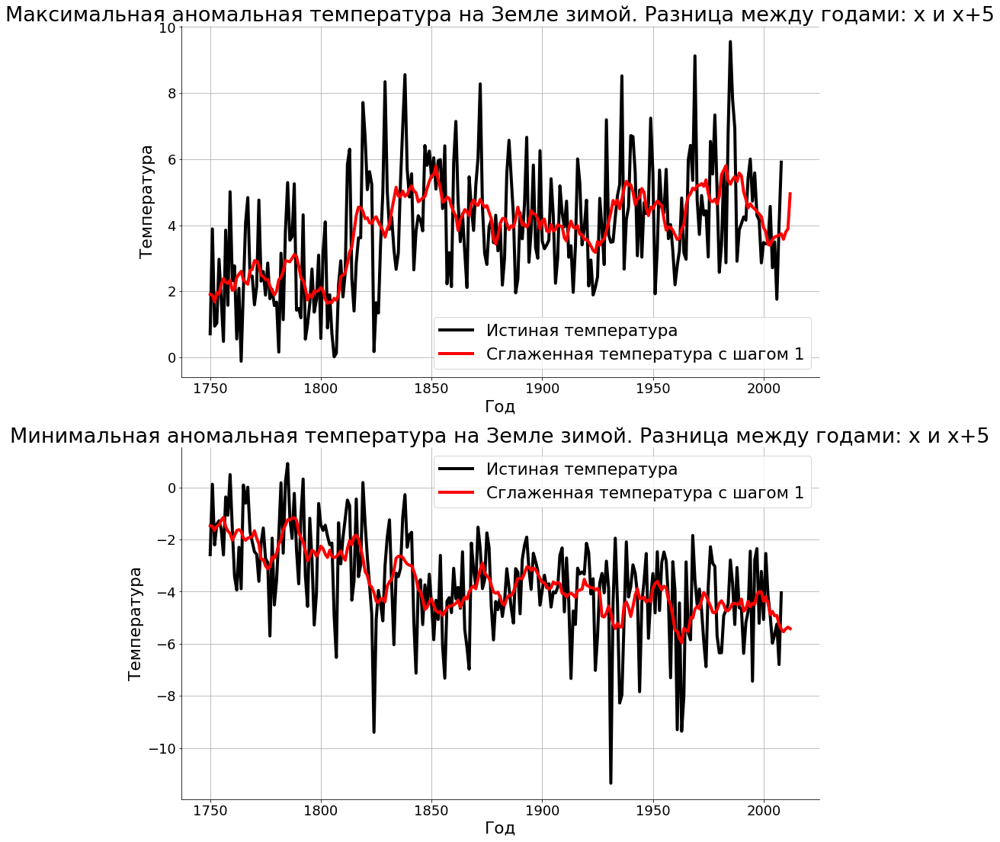

In [179]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 5, 10)

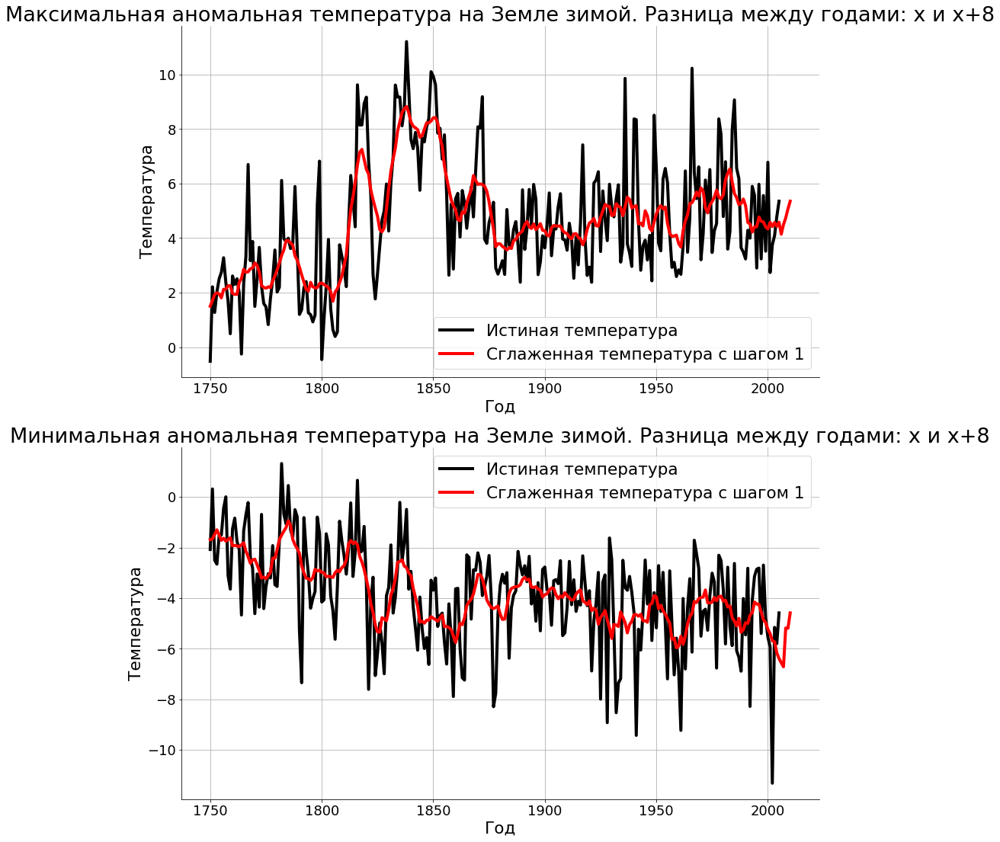

In [180]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 8, 5)

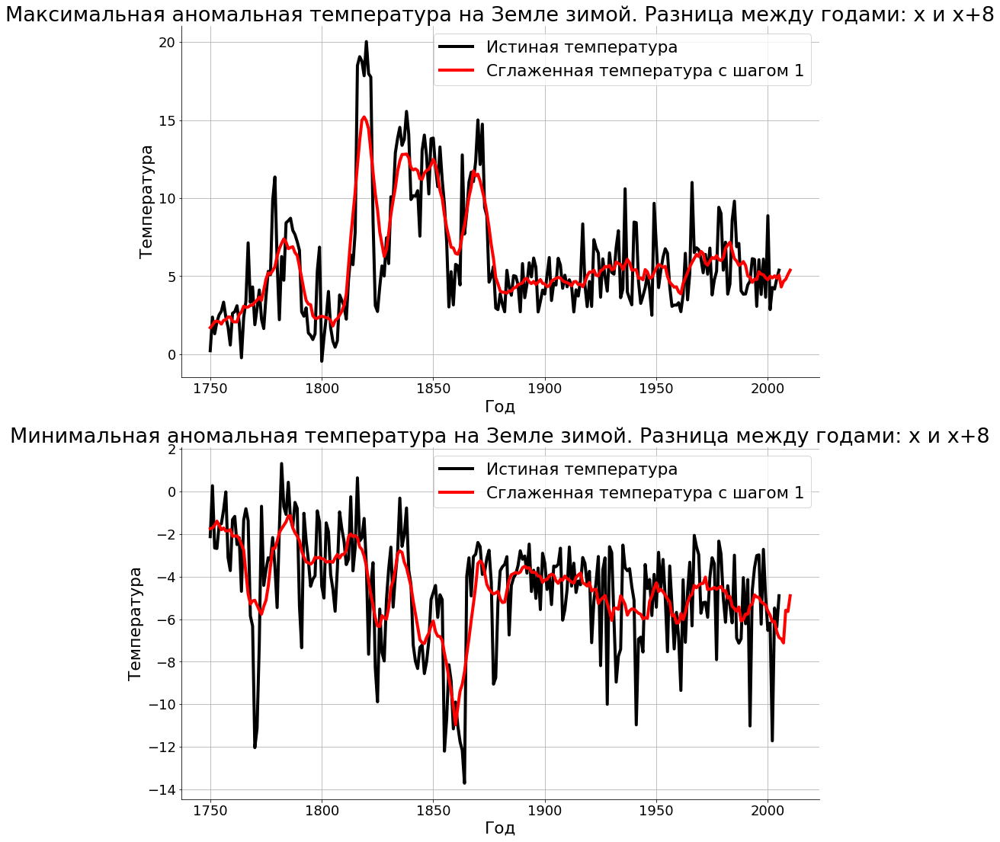

In [133]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 8)

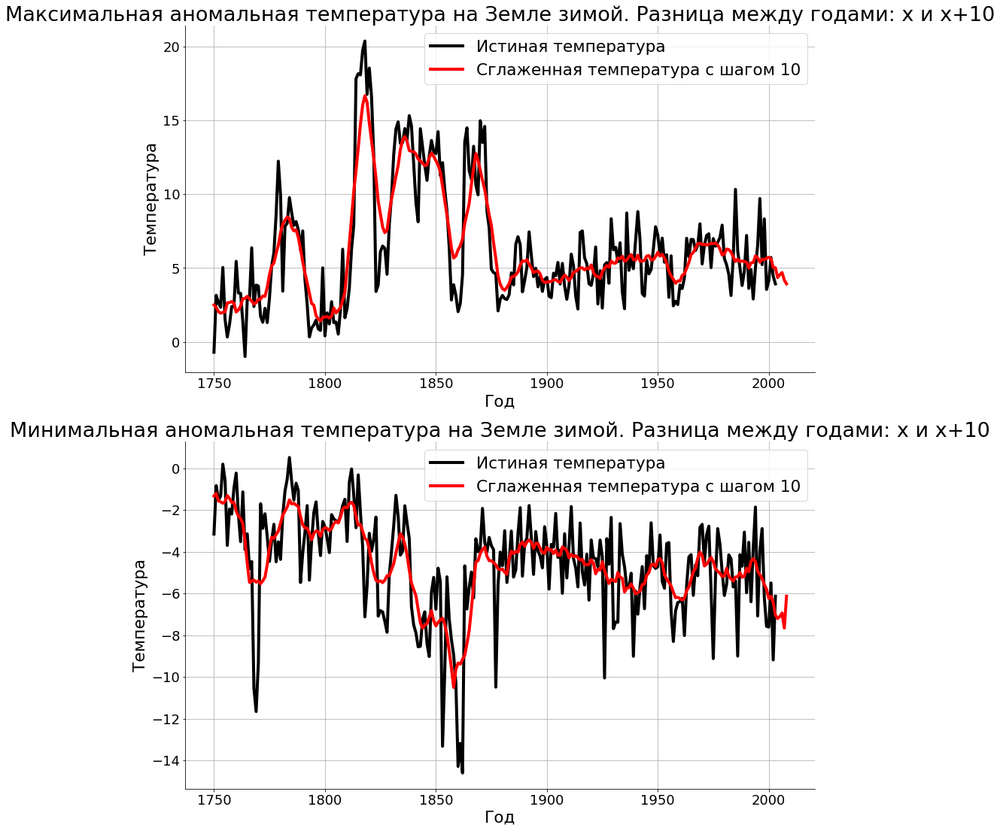

In [50]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 10)

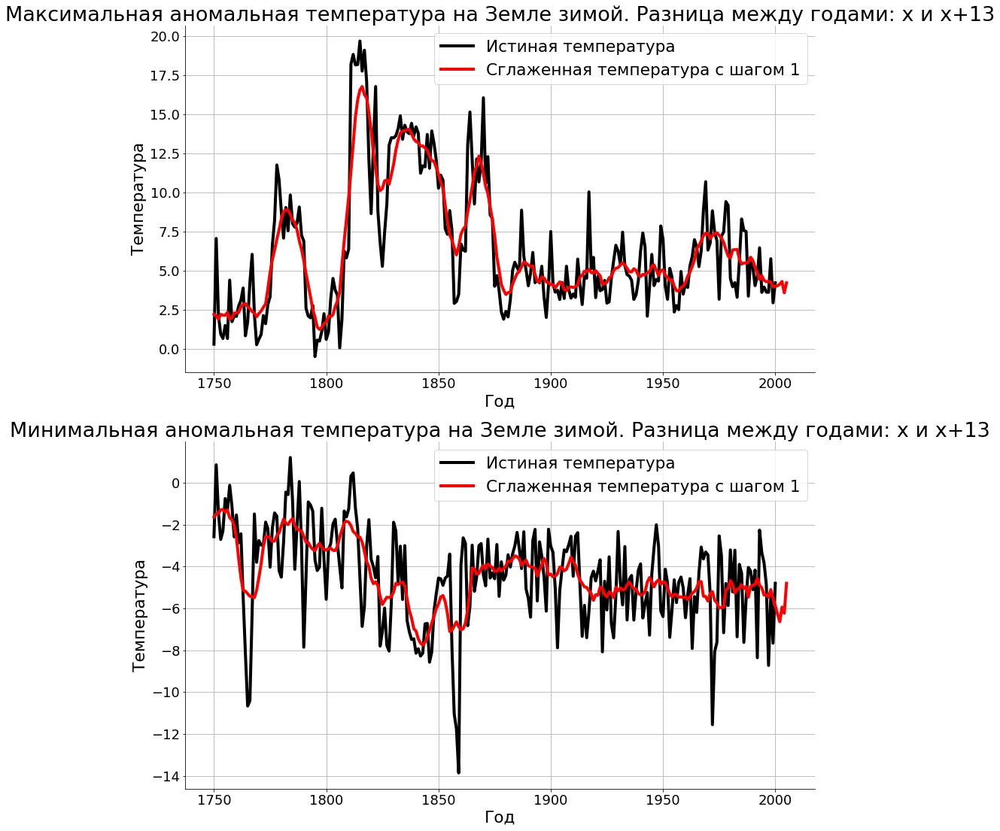

In [135]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 13)

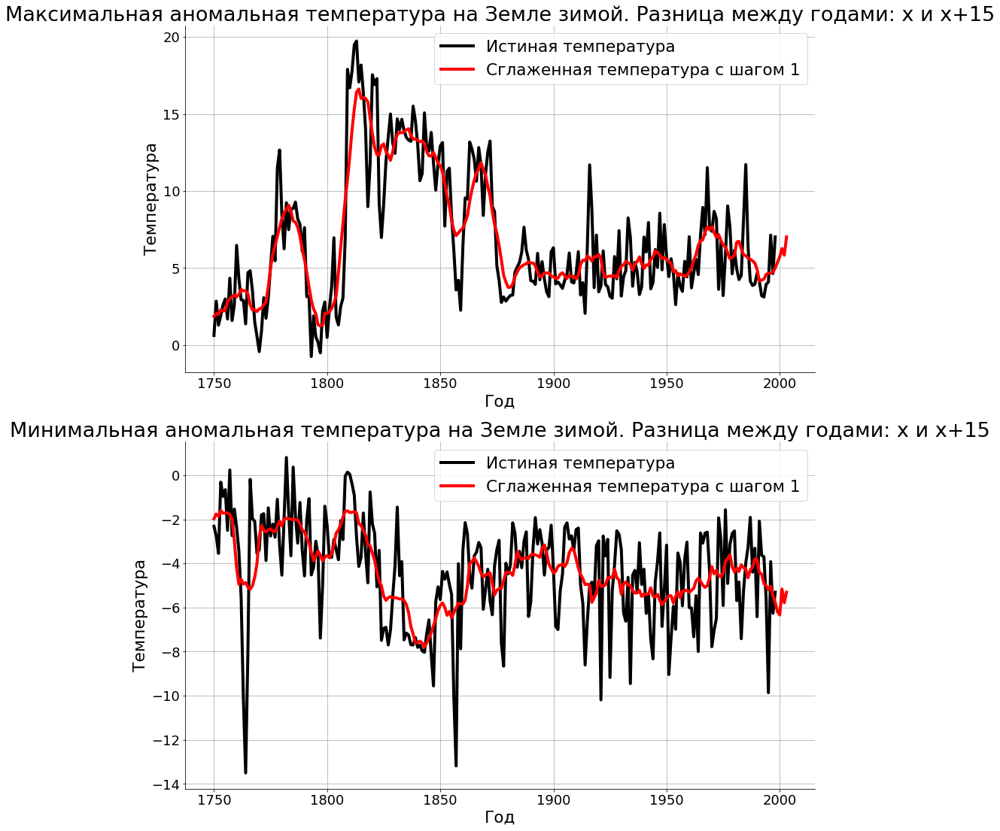

In [136]:
calc_and_plot_extreme_temperature(winter_mask, 'зимой', 1750, 2013, 15)

# Летние периоды

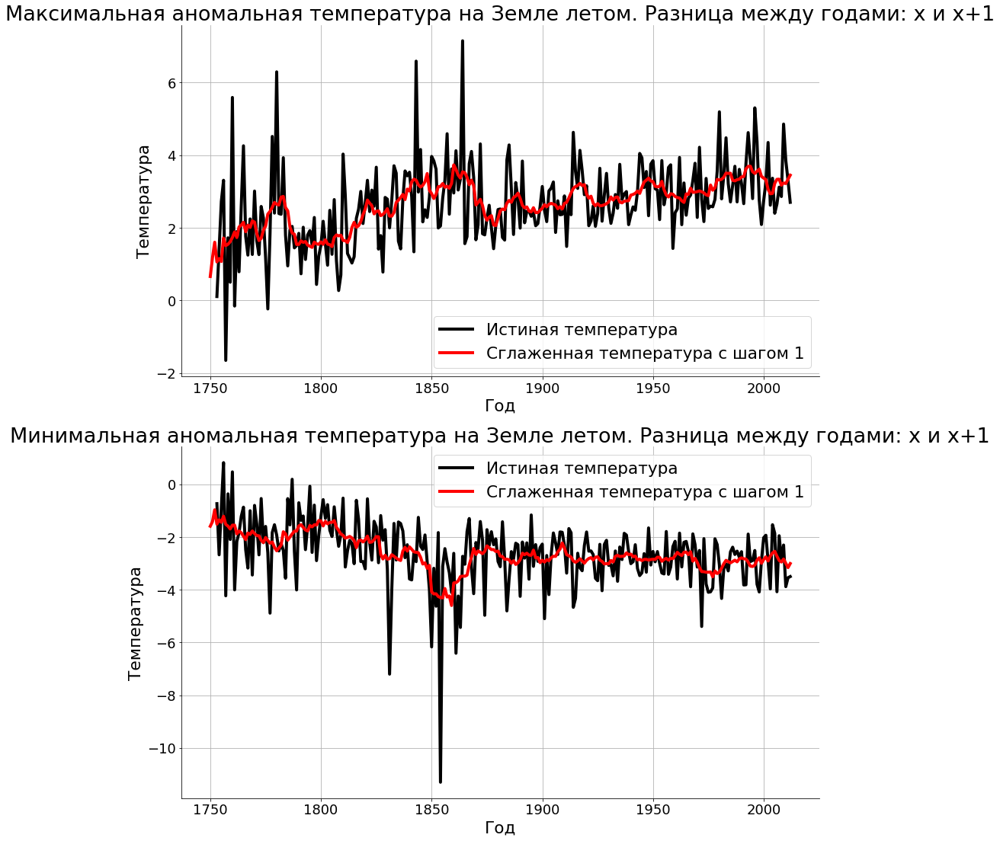

In [137]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 1)

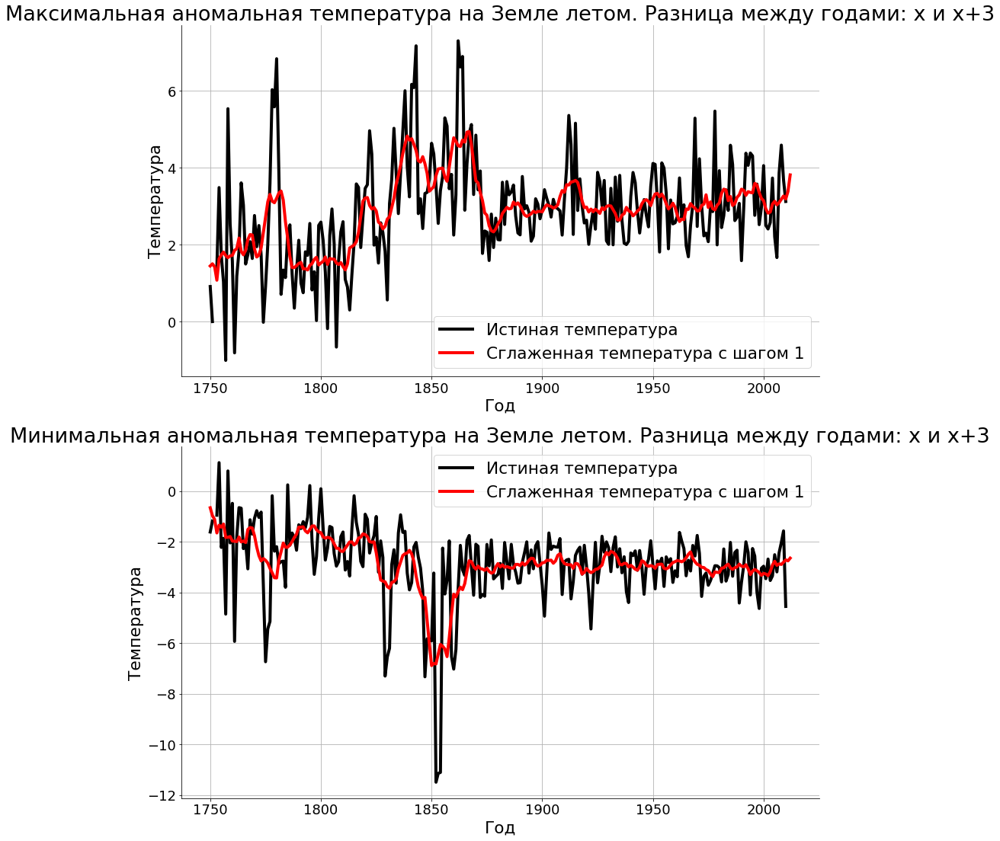

In [138]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 3)

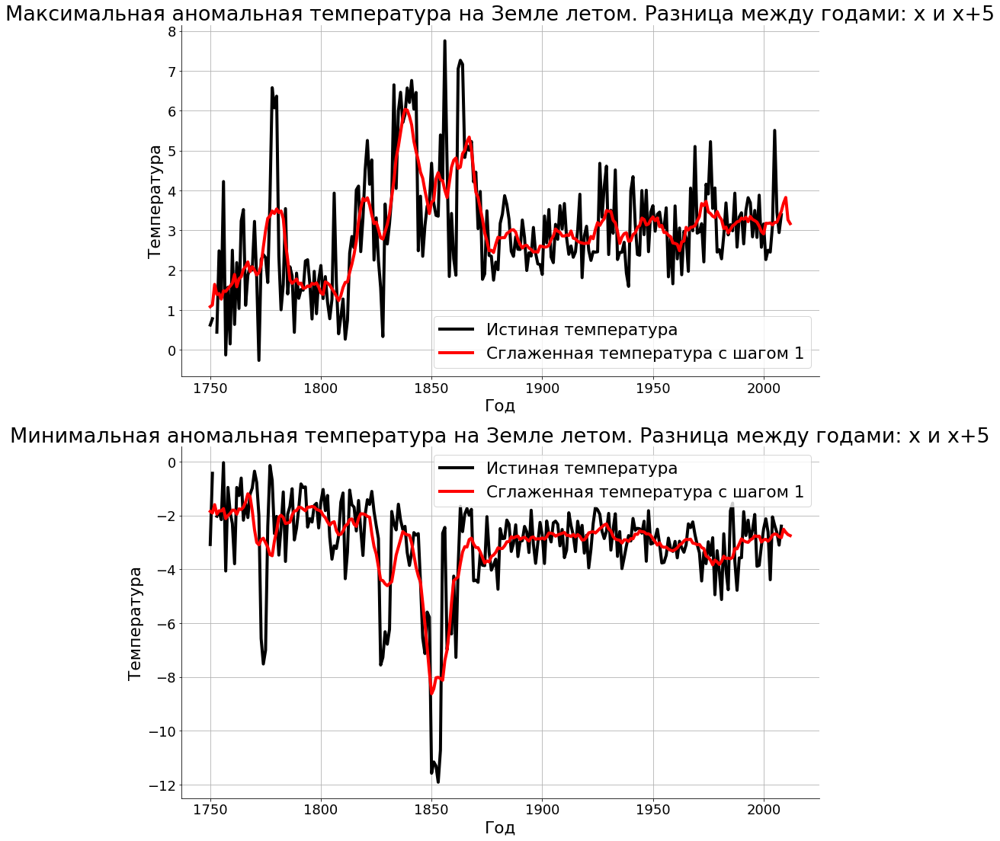

In [139]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 5)

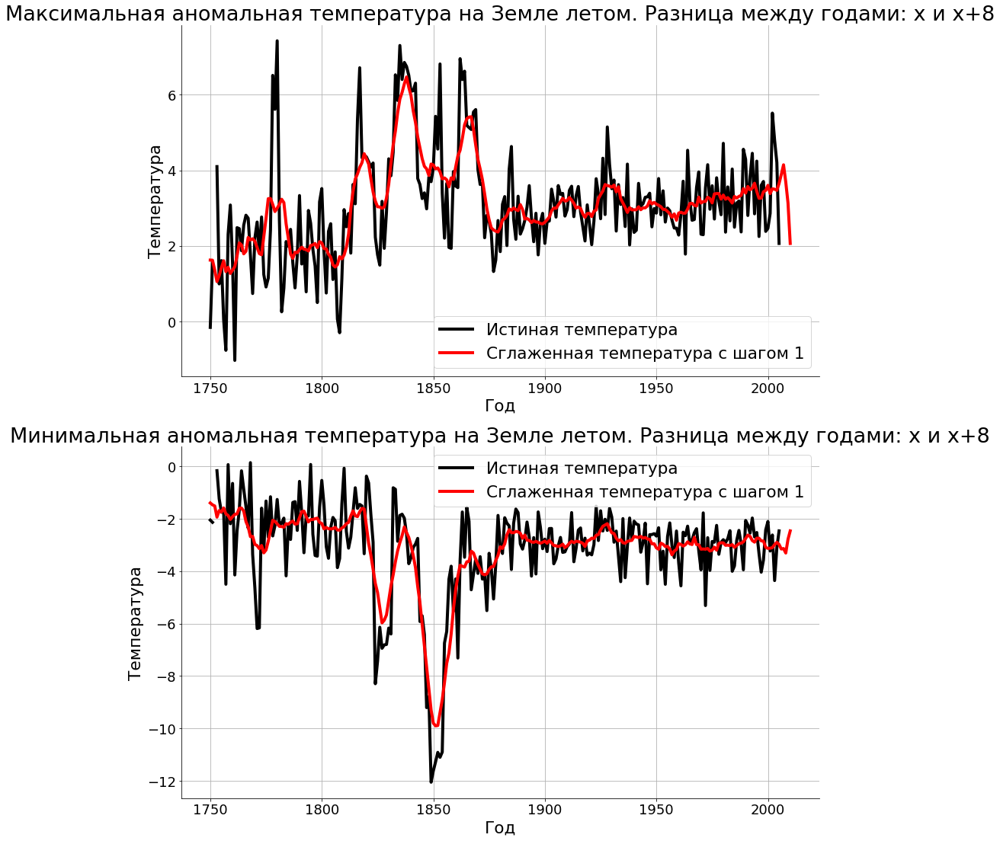

In [140]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 8)

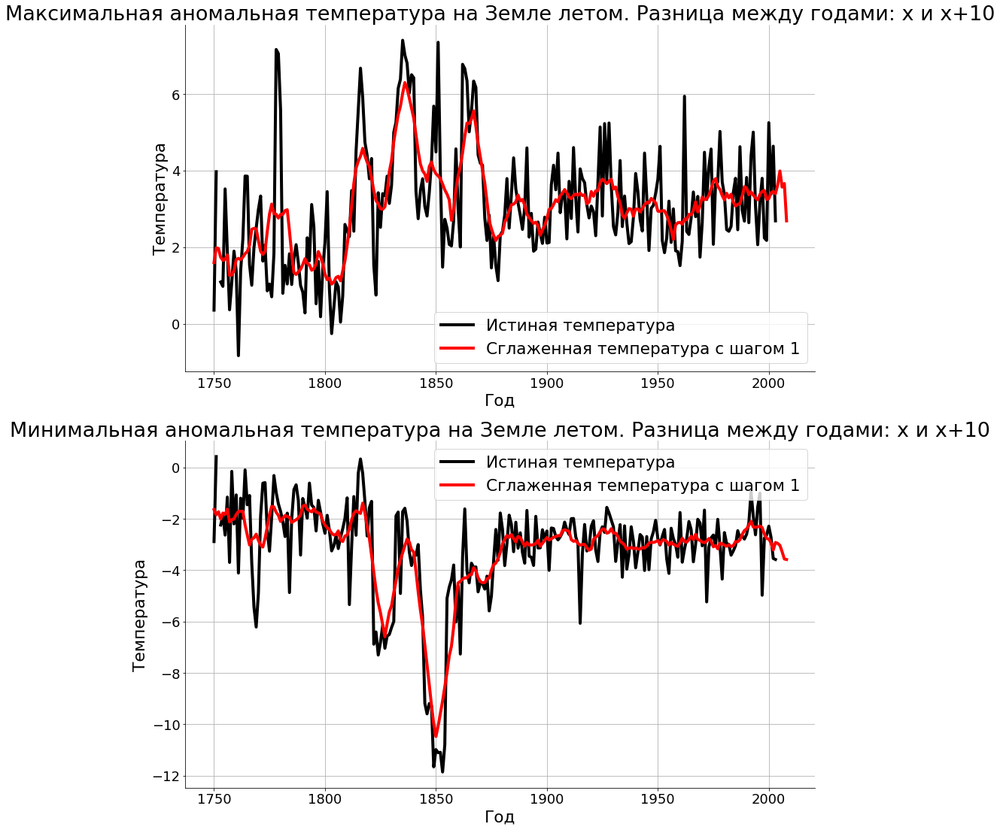

In [141]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 10)

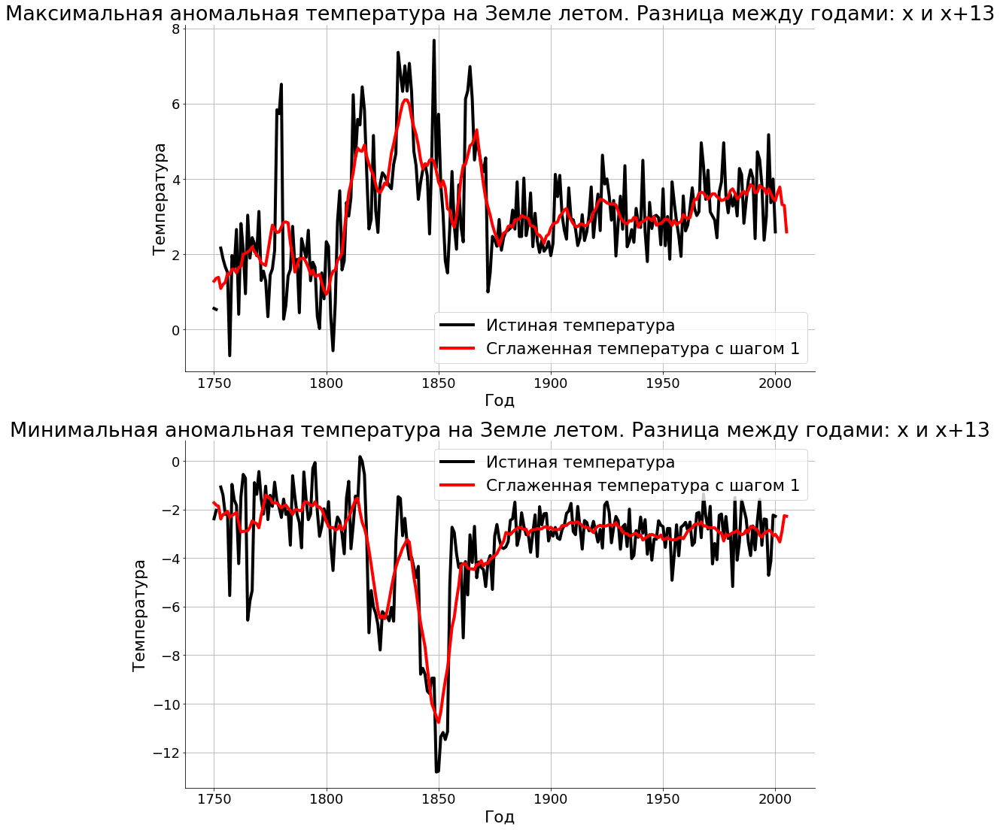

In [142]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 13)

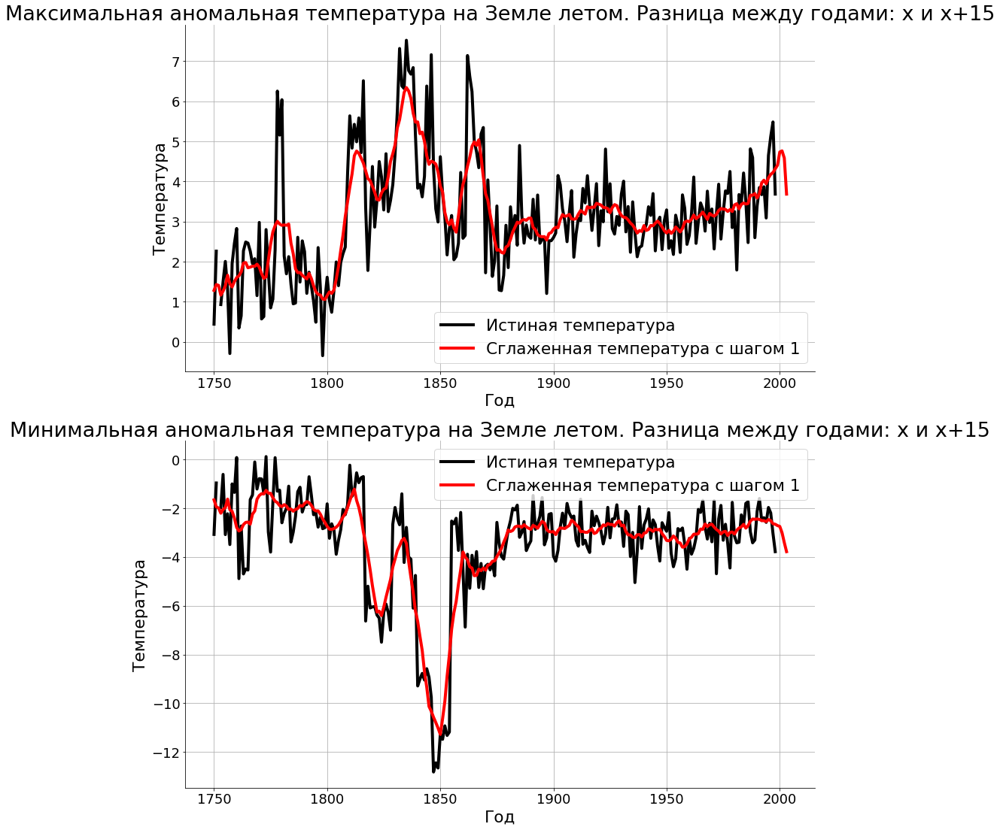

In [143]:
calc_and_plot_extreme_temperature(summer_mask, 'летом', 1750, 2013, 15)

In [53]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1809, 1814, 1800, 1804, winter_mask)

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для зим 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для зим 1809--1814')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для зим 1809--1814 и 1800--1804')

In [54]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1809, 1814, 1800, 1804, summer_mask)

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для летних периодов 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для летних периодов 1809--1814')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для летних периодов 1809--1814 и 1800--1804')

In [64]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1782, 1783, 1800, 1804, winter_mask)
groupped_cities_diff = groupped_cities_diff.drop('Alexandria')

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для зим 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для зим 1782--1783')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для зим 1782--1783 и 1800--1804')

In [65]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1782, 1783, 1800, 1804, summer_mask)

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для летних периодов 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для летних периодов 1782--1783')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для летних периодов 1782--1783 и 1800--1804')

In [66]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1771, 1775, 1800, 1804, winter_mask)
groupped_cities_diff = groupped_cities_diff.drop('Alexandria')
groupped_cities_diff = groupped_cities_diff.drop('Ufa')

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для зим 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для зим 1771--1775')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для зим 1771--1775 и 1800--1804')

In [67]:
groupped_cities_hot, groupped_cities_cold, groupped_cities_diff = filter_period(1772, 1775, 1800, 1804, summer_mask)

plotly_map_temperature(groupped_cities_hot, 'Средние температуры для летних периодов 1800--1804')
plotly_map_temperature(groupped_cities_cold, 'Средние температуры для летних периодов 1771--1775')
plotly_map_temperature(groupped_cities_diff, 'Разница между средними температурами для летних периодов 1771--1775 и 1800--1804')

Относительно океана сказать что-то сложнее. Единственное, что очевидно, так это то, что общая температура океана повышается

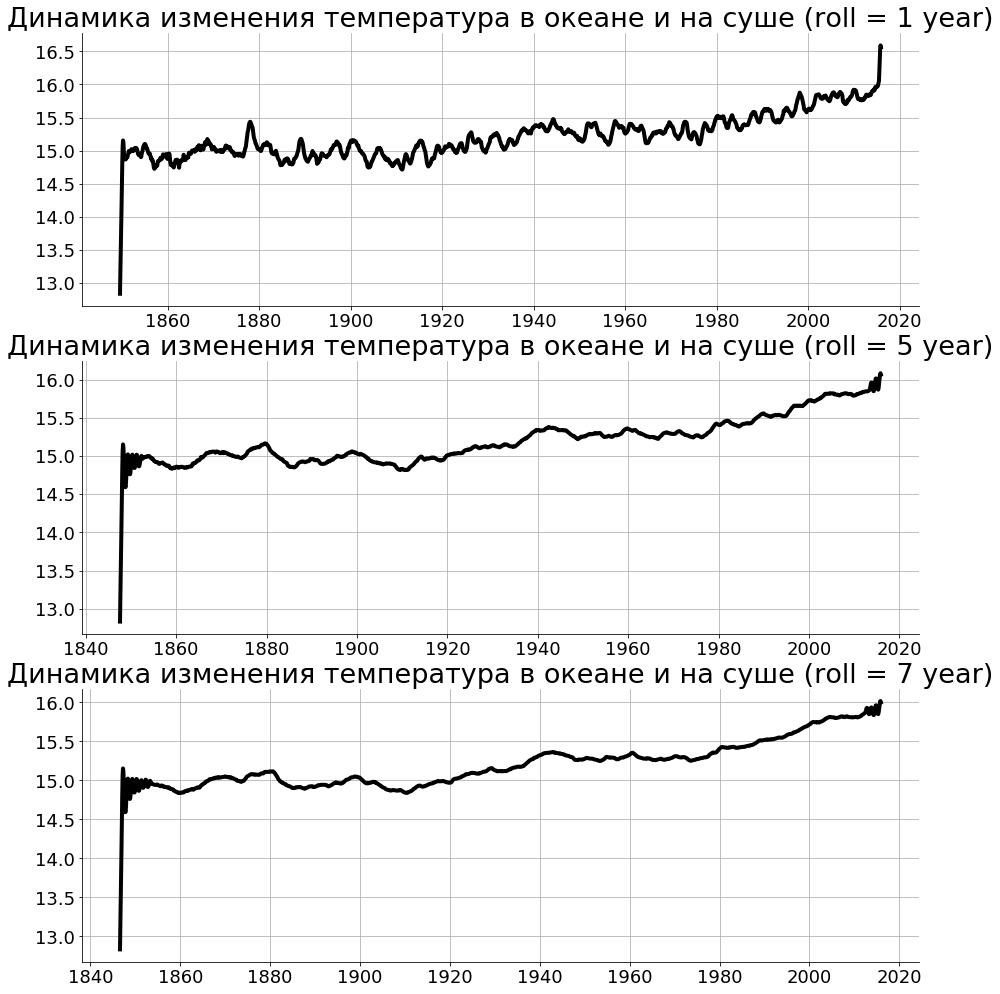

In [17]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(top=1.2)
ax = plt.subplot(311)
fontsize = 18
roll_step = 12


x = temperature['dt']
y = temperature['LandAndOceanAverageTemperature'].rolling(roll_step, min_periods=1, center=True).mean()
plt.plot(x, y, linewidth=4, color='k')
plt.title('Динамика изменения температура в океане и на суше (roll = 1 year)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax = plt.subplot(312)
y = temperature['LandAndOceanAverageTemperature'].rolling(roll_step * 5, min_periods=1, center=True).mean()
plt.plot(x, y, linewidth=4, color='k')
plt.title('Динамика изменения температура в океане и на суше (roll = 5 year)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax = plt.subplot(313)
y = temperature['LandAndOceanAverageTemperature'].rolling(roll_step * 7, min_periods=1, center=True).mean()
plt.plot(x, y, linewidth=4, color='k')
plt.title('Динамика изменения температура в океане и на суше (roll = 7 year)', fontsize=fontsize*1.5)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

In [18]:
def plot_mean_temperature(roll_step, ax, column='LandAverageTemperature', title='Динамика изменения температура на суше'):
    fontsize = 28
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
                  '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
                  '#bcbd22', '#17becf', '#e377c2', 'k']
    month_name = ['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декарбрь']
    for month in range(12):
        mask = temperature['dt'].apply(lambda row: row.month == month + 1)
        x = temperature[mask]['dt']
        y = temperature[mask][column].rolling(roll_step, min_periods=1, center=True).mean()
        plt.plot(x, y, linewidth=4, color=colors[month])
        plt.text(x.iloc[-1], y.iloc[-1], month_name[month], fontsize=fontsize, color=colors[month])
    plt.title(title + ' (roll = %d)' % roll_step, fontsize=fontsize*1.5)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.grid(True)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

Рассматривая графики динамики изменения температуры на суше по месяцам, можно сделать несколько замечаний. Во-первых, месяц декабрь в ряде случаев запаздывает или догоняет январь и февраль. Это, очевидно, связано с цикличностью летоисчисления. 

Также стоит отметить, что месяцы практически симметрично делятся на 5 групп:

* 3 группы на осень -- весну (по месяцу), причём осень в среднем оказывается теплее. Но связано это, скорее всего не с тем, что она, действительно, теплее, а стем, что в южное полушарие обладает меньшей долей суши, по сравнению с северным. Если взглянуть на среднюю температуру для океана и суши вместе взятые, то окажется, что зазор между соответствующими графиками меньше, что косвенно подтверждает гипотезу
* 2 группы на лето и зиму

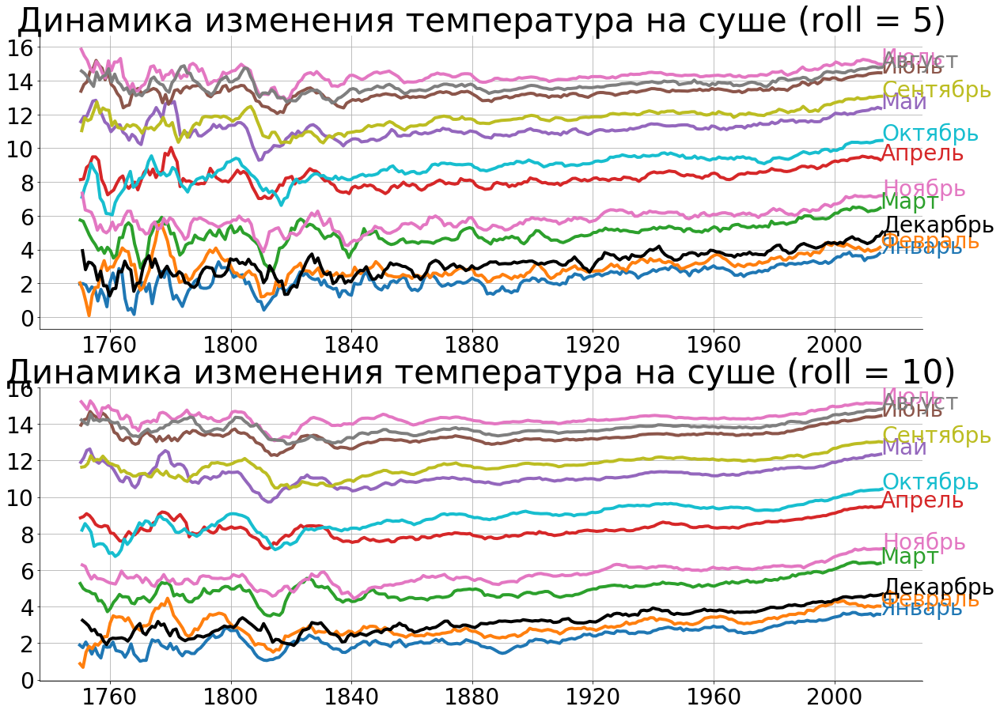

In [19]:
plt.figure(figsize=(20, 15))
ax = plt.subplot(211)
plot_mean_temperature(5, ax)

ax = plt.subplot(212)
plot_mean_temperature(10, ax)

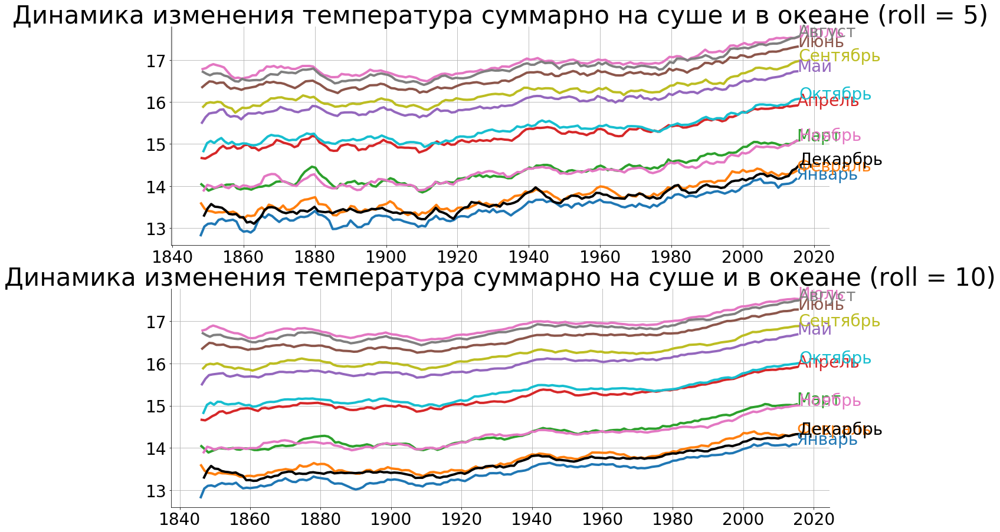

In [20]:
plt.figure(figsize=(20, 15))
ax = plt.subplot(211)
plot_mean_temperature(5, ax, 'LandAndOceanAverageTemperature', title='Динамика изменения температура суммарно на суше и в океане')

ax = plt.subplot(212)
plot_mean_temperature(10, ax, 'LandAndOceanAverageTemperature', title='Динамика изменения температура суммарно на суше и в океане')

К вопросу о точности измерений, стоит сказать, что при увеличении года, точность возрастает:

In [527]:
col = 'sigma_quantile'
data = [ dict(
        type = 'scattergeo',
        lon = city_metrics['lon'],
        lat = city_metrics['lat'],
        text = city_metrics.index,
        mode = 'markers',
        marker = dict(
            size = 5,
            reversescale = False,
            autocolorscale = False,
            symbol = 'circle',
            color = city_metrics['sigma_quantile'],
            cmax = city_metrics[col].max(),
            cmin = city_metrics[col].min(),
            colorbar=dict(title="Величина отклонения")
        ))]

layout = dict(
        title = 'Среднеквадратичное отклонение точностей измерений температуры в июле',
    )


fig = dict(data=data, layout=layout)
py.iplot(fig)

In [529]:
data = [ dict(
        type = 'choropleth',
        locations = country_names,
        z = percents_nan,
        locationmode = 'country names',
        text = country_names,
        marker = dict(
            line = dict(color = 'rgb(0,0,0)', width = 1)),
            colorbar = dict(autotick = True, tickprefix = '', 
            title = 'Average Temperature, °C')
            )
       ]

layout = dict(
    title = 'Доля неизвестных записей для температур',
    geo = dict(
        showframe = False,
        showocean = True,
        oceancolor = 'rgb(0,255,255)',
        type = 'equirectangular',
#         projection = dict(
#             type = 'orthographic',
#             rotation = dict(
#                     lon = 60,
#                     lat = 10),
#         ),
        lonaxis =  dict(
                showgrid = True,
                gridcolor = 'rgb(102, 102, 102)'
            ),
        lataxis = dict(
                showgrid = True,
                gridcolor = 'rgb(102, 102, 102)'
                )
            ),
        )

fig = dict(data=data, layout=layout)
py.iplot(fig, validate=False)

In [532]:
roll_step = 30
month_num = 5

def roll_temperature(data, filter_name, month_num, roll_step, column_name='Country', isTwoSide=True, draw=False, is_remove_mean=False, new_fig=True):
    filtered = data[data[column_name] == filter_name]
    filtered = filtered[filtered['dt'].apply(lambda row: row.month) == month_num].dropna()
    y = filtered[filtered['dt'].apply(lambda row: row.month) == month_num]['AverageTemperature'].rolling(roll_step, min_periods=1, center=True).min()
    if isTwoSide:
        y[:2*roll_step] = filtered[filtered['dt'].apply(lambda row: row.month) == month_num]['AverageTemperature'][::-1].rolling(roll_step, min_periods=1, center=True).min()[::-1][:2*roll_step]
    x = filtered['dt'].values
    y = y.values
    if is_remove_mean:
        y -= np.mean(y)
    if draw and new_fig:
        plt.figure(figsize=(15, 10))
    if draw:
        plt.plot(x, y)
    return x, y

In [533]:
   
country_time_series = pd.DataFrame(index=country_names)
country_time_series['time_series'] = None
for country_ in tqdm_notebook(country_names):
    _, country_y = roll_temperature(country, country_, month_num, roll_step, is_remove_mean=True)
    country_time_series.at[country_, 'time_series'] = country_y

In [534]:
def partial_norm(x, y, aggfunc, roll=50):
    x = x[:min(y.shape[0], x.shape[0])]
    y = y[:min(y.shape[0], x.shape[0])]
    res = [np.inf]
    for i in range(roll, x.shape[0]):
        res.append(aggfunc(x[i-roll:i], y[i-roll:i]))
    return np.min(res)

max_norm = lambda x, y: np.max(np.abs(x[:min(y.shape[0], x.shape[0])] - y[:min(y.shape[0], x.shape[0])]))
euclid_norm = lambda x, y: np.sqrt(np.sum((x[:min(y.shape[0], x.shape[0])] - y[:min(y.shape[0], x.shape[0])]) ** 2))

In [535]:
max_norm_df = pd.DataFrame(index=country_names, columns=country_names)
euclid_norm_df = pd.DataFrame(index=country_names, columns=country_names)
partial_euclid_norm_df = {
    10: pd.DataFrame(index=country_names, columns=country_names),
    20: pd.DataFrame(index=country_names, columns=country_names),
    50: pd.DataFrame(index=country_names, columns=country_names),
    80: pd.DataFrame(index=country_names, columns=country_names),
    100: pd.DataFrame(index=country_names, columns=country_names),
    150: pd.DataFrame(index=country_names, columns=country_names),
    200: pd.DataFrame(index=country_names, columns=country_names),
}
partial_max_norm_df = {
    10: pd.DataFrame(index=country_names, columns=country_names),
    20: pd.DataFrame(index=country_names, columns=country_names),
    50: pd.DataFrame(index=country_names, columns=country_names),
    80: pd.DataFrame(index=country_names, columns=country_names),
    100: pd.DataFrame(index=country_names, columns=country_names),
    150: pd.DataFrame(index=country_names, columns=country_names),
    200: pd.DataFrame(index=country_names, columns=country_names),
}

for country_i in tqdm_notebook(country_names):
    for country_j in country_names:
        a = country_time_series.loc[country_i, 'time_series']
        b = country_time_series.loc[country_j, 'time_series']
        max_norm_df.at[country_i, country_j] = max_norm(a, b)
        euclid_norm_df.at[country_i, country_j] = euclid_norm(a, b)
        for key in partial_euclid_norm_df:
            partial_euclid_norm_df[key].at[country_i, country_j] = partial_norm(a, b, aggfunc=euclid_norm, roll=key)
        for key in partial_max_norm_df:
            partial_euclid_norm_df[key].at[country_i, country_j] = partial_norm(a, b, aggfunc=max_norm, roll=key)

Далее не отлаженный код

In [ ]:
i0, i1, t0, t1 = 0, 242, 0.015, 0.016
df_ = partial_euclid_norm_df[50]
cols, index = np.where((df_[df_.columns[i0:i1]].iloc[i0:i1] < t1) & (df_[df_.columns[i0:i1]].iloc[i0:i1] > t0) & (~df_[df_.columns[i0:i1]].iloc[i0:i1].isnull()) & (df_[df_.columns[i0:i1]].iloc[i0:i1] > 0) )
sns.heatmap(df_[df_.columns[cols]].iloc[index].astype(float))

0.26496551724137873

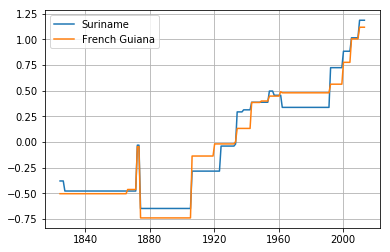

In [537]:
c0 = 'Suriname'
c1 = 'French Guiana'
roll_temperature(country, c0, month_num, roll_step, draw=True, is_remove_mean=True, new_fig=False);
roll_temperature(country, c1, month_num, roll_step, draw=True, is_remove_mean=True, new_fig=False);
plt.legend([c0, c1])
plt.grid(True)

a = country_time_series.loc[c0, 'time_series']
b = country_time_series.loc[c1, 'time_series']
partial_norm(a, b, aggfunc=max_norm, roll=100)

In [305]:
i0, i1, t0, t1 = 0, 242, 0.015, 0.016
df_ = partial_euclid_norm_df[50]
cols, index = np.where((df_[df_.columns[i0:i1]].iloc[i0:i1] < t1) & (df_[df_.columns[i0:i1]].iloc[i0:i1] > t0) & (~df_[df_.columns[i0:i1]].iloc[i0:i1].isnull()) & (df_[df_.columns[i0:i1]].iloc[i0:i1] > 0) )
best_pairs = list(zip(list(df_.columns[cols]), list(df_.index[index])))
for ind, best_pair in enumerate(best_pairs):
    if best_pair[0] > best_pair[1]:
        best_pairs[ind] = (best_pair[1], best_pair[0])
np.unique(sorted(best_pairs, key=lambda x: x[0] + x[1]), axis=0)

array([['Anguilla', 'Saint Kitts And Nevis'],
       ['Dominica', 'Guadeloupe'],
       ['Dominica', 'Saint Lucia'],
       ['French Guiana', 'Suriname'],
       ['Guadeloupe', 'Martinique'],
       ['Martinique', 'Saint Lucia'],
       ['Saint Barthélemy', 'Saint Kitts And Nevis'],
       ['Saint Kitts And Nevis', 'Saint Martin'],
       ['Saint Kitts And Nevis', 'Sint Maarten']], dtype='<U21')

In [38]:
df_flight_paths = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_aa_flight_paths.csv')
df_airports = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')

airports = [ dict(
        type = 'scattergeo',
        locationmode = 'country names',
        lon = df_airports['long'],
        lat = df_airports['lat'],
        hoverinfo = 'text',
        text = df_airports['airport'],
        mode = 'markers',
        marker = dict( 
            size=2, 
            color='rgb(255, 0, 0)',
            line = dict(
                width=3,
                color='rgba(68, 68, 68, 0)'
            )
        ))]
        
flight_paths = []
for i in range( len( df_flight_paths ) ):
    flight_paths.append(
        dict(
            type = 'scattergeo',
            locationmode = 'country names',
            lon = [ df_flight_paths['start_lon'][i], df_flight_paths['end_lon'][i] ],
            lat = [ df_flight_paths['start_lat'][i], df_flight_paths['end_lat'][i] ],
            mode = 'lines',
            line = dict(
                width = 1,
                color = 'red',
            ),
            opacity = float(df_flight_paths['cnt'][i])/float(df_flight_paths['cnt'].max()),
        )
    )
    
layout = dict(
        title = 'Feb. 2011 American Airline flight paths<br>(Hover for airport names)',
        showlegend = False, 
        geo = dict(
            showland = True,
            landcolor = 'rgb(243, 243, 243)',
            countrycolor = 'rgb(204, 204, 204)',
        ),
    )
    
fig = dict( data=flight_paths + airports, layout=layout )
py.iplot( fig, filename='d3-flight-paths' )

In [370]:
mask = (city['dt'] >= datetime(year=1860, month=1, day=1)) & \
(city['Country'] == 'Russia') & \
(city['AverageTemperature'] > 10) & (city['AverageTemperatureUncertainty'] > 5) & \
(city['AverageTemperature'] > 18)

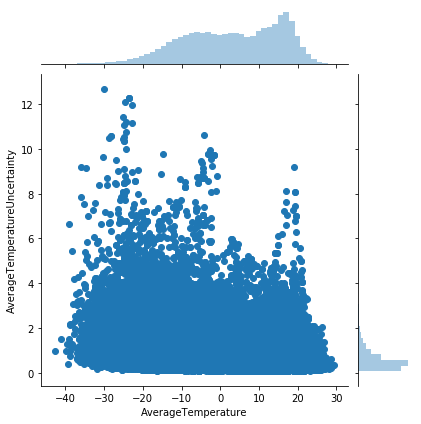

In [371]:
x = city[mask]['AverageTemperature']
y = city[mask]['AverageTemperatureUncertainty']
sns.jointplot(city[mask]['AverageTemperature'], city[mask]['AverageTemperatureUncertainty'])

In [375]:
mask = (city['dt'] >= datetime(year=1860, month=1, day=1)) & \
(city['Country'] == 'Russia') & \
(city['AverageTemperature'] > 10) & (city['AverageTemperatureUncertainty'] > 5)

lats = []
lons = []
for city_ in city[mask]['City'].unique():
    lats.append(city_coords[city_coords.index == city_]['lat'].iloc[0])
    lons.append(city_coords[city_coords.index == city_]['lon'].iloc[0])

In [373]:
col = 'mean_less_quantile'
data = [ dict(
        type = 'scattergeo',
        lon = lons,
        lat = lats,
        text = c.index,
        mode = 'markers',
        marker = dict(
            size = 5,
            reversescale = False,
            autocolorscale = False,
            symbol = 'circle'
        ))]

layout = dict(
        title = 'Count noised points',
        colorbar = True,
        geo = dict(
            type = 'equirectangular',
        ),
    )


fig = dict( data=data)
py.iplot( fig)

ValueError: x and y must have same first dimension, but have shapes (716966,) and (158,)

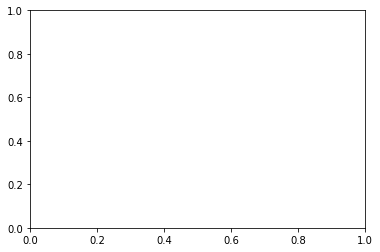

In [410]:
january = city[city['dt'].apply(lambda row: row.month == 1)]
july = city[city['dt'].apply(lambda row: row.month == 7)]
year = january['dt'].apply(lambda row: row.year)
delta = np.abs(january[january['City'] == city_]['AverageTemperature'].values - july[july['City'] == city_]['AverageTemperature'].values)
plt.plot(year, delta)

In [ ]:
for city_ in tqdm_notebook(cities_names):
    year = january['dt'].apply(lambda row: row.year)
    delta = np.abs(january[january['City'] == city_]['AverageTemperature'].values - july[july['City'] == city_]['AverageTemperature'].values)

# Вопросы?